# Import Library

In [ ]:
!pip install ydata-profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.1/400.1 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 30.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 3.0 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=18e3ed1de316a805156a40753ff0870548e2dacf8245006da01843eb683df10d
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin


In [ ]:
# =================== LOAD DATASET ===================
import pandas as pd
import numpy as np

# =================== DATA PREPROCESSING & EDA ===================
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from scipy import stats
import pandas_profiling as pp

# =================== OUTLIER DETECTION ===================
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor

# =================== KLASIFIKASI & MODELING ===================
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, balanced_accuracy_score, classification_report
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# Models
from sklearn.ensemble import RandomForestClassifier
import lightgbm as lgb
from xgboost import XGBClassifier

# =================== CLUSTERING ===================
from sklearn.cluster import DBSCAN
import hdbscan
import umap

# =================== VISUALISASI ===================
import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


# Load Dataset

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/S2 - SEMESTER 2/Statistical Machine Learning/Tugas Kelompok - Ketahanan Pangan/IKP-TAHUN-2018-2023.csv')

In [ ]:
df

,No.,Tahun,Wilayah,Kategori Ketahanan Pangan (Ordinal),NCPR,Kemiskinan (%),Pengeluaran Pangan (%),Tanpa Listrik (%),Tanpa Air Bersih (%),Lama Sekolah Perempuan (tahun),Rasio Tenaga Kesehatan,Angka Harapan Hidup (tahun),Prevalensi of Undernourishment (%),Jumlah Penduduk (Rasio),Penduduk Undernourish (Rasio),Stunting (%),IKP,IKP Ranking
0,1,2018,aceh - aceh selatan,4,0.69,14.07,69.08,0.50,53.23,8.41,5.49,63.89,11.76,235115,27650,44.9,67.24,297
1,2,2018,aceh - aceh tenggara,5,0.33,14.86,58.78,2.02,56.35,9.63,4.86,67.62,7.54,212417,16016,38.2,72.54,224
2,3,2018,aceh - aceh timur,5,0.51,15.25,47.94,0.60,50.06,8.23,3.68,68.33,7.28,427567,31127,43.6,72.26,229
3,4,2018,aceh - aceh tengah,4,1.79,16.84,42.96,0.00,53.57,9.85,3.85,68.53,6.71,208505,13991,37.2,65.51,309
4,5,2018,aceh - aceh barat,5,0.42,20.28,42.10,2.29,33.76,9.38,2.32,67.62,8.01,205971,16498,33.2,75.45,157
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3079,3080,2023,papua barat - tambrauw,1,5.00,32.45,47.33,0.16,53.36,10.60,0.49,60.68,34.92,30606,10688,24.9,32.88,400
3080,3081,2023,papua barat - maybrat,2,5.00,31.14,4.13,0.17,65.54,11.83,0.09,65.53,48.23,40685,19622,17.7,41.60,395
3081,3082,2023,papua barat - manokwari selatan,4,1.42,28.55,30.73,3.45,34.88,9.90,1.52,67.84,18.13,46287,8392,19.1,67.12,316
3082,3083,2023,papua barat - pegunungan arfak,1,5.00,33.71,16.75,35.95,60.80,11.62,0.18,67.50,33.62,68501,23030,27.2,32.87,401


In [ ]:
df = df.drop(columns=['No.', 'Wilayah', 'Tahun', 'IKP', 'IKP Ranking'])
df


,Kategori Ketahanan Pangan (Ordinal),NCPR,Kemiskinan (%),Pengeluaran Pangan (%),Tanpa Listrik (%),Tanpa Air Bersih (%),Lama Sekolah Perempuan (tahun),Rasio Tenaga Kesehatan,Angka Harapan Hidup (tahun),Prevalensi of Undernourishment (%),Jumlah Penduduk (Rasio),Penduduk Undernourish (Rasio),Stunting (%)
0,4,0.69,14.07,69.08,0.50,53.23,8.41,5.49,63.89,11.76,235115,27650,44.9
1,5,0.33,14.86,58.78,2.02,56.35,9.63,4.86,67.62,7.54,212417,16016,38.2
2,5,0.51,15.25,47.94,0.60,50.06,8.23,3.68,68.33,7.28,427567,31127,43.6
3,4,1.79,16.84,42.96,0.00,53.57,9.85,3.85,68.53,6.71,208505,13991,37.2
4,5,0.42,20.28,42.10,2.29,33.76,9.38,2.32,67.62,8.01,205971,16498,33.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3079,1,5.00,32.45,47.33,0.16,53.36,10.60,0.49,60.68,34.92,30606,10688,24.9
3080,2,5.00,31.14,4.13,0.17,65.54,11.83,0.09,65.53,48.23,40685,19622,17.7
3081,4,1.42,28.55,30.73,3.45,34.88,9.90,1.52,67.84,18.13,46287,8392,19.1
3082,1,5.00,33.71,16.75,35.95,60.80,11.62,0.18,67.50,33.62,68501,23030,27.2


In [ ]:
df['Status Ketahanan Pangan'] = df['Kategori Ketahanan Pangan (Ordinal)'].map({1: 1, 2: 1, 3: 2, 4: 2, 5: 3, 6: 3})

In [ ]:
df

,Kategori Ketahanan Pangan (Ordinal),NCPR,Kemiskinan (%),Pengeluaran Pangan (%),Tanpa Listrik (%),Tanpa Air Bersih (%),Lama Sekolah Perempuan (tahun),Rasio Tenaga Kesehatan,Angka Harapan Hidup (tahun),Prevalensi of Undernourishment (%),Jumlah Penduduk (Rasio),Penduduk Undernourish (Rasio),Stunting (%),Status Ketahanan Pangan
0,4,0.69,14.07,69.08,0.50,53.23,8.41,5.49,63.89,11.76,235115,27650,44.9,2
1,5,0.33,14.86,58.78,2.02,56.35,9.63,4.86,67.62,7.54,212417,16016,38.2,3
2,5,0.51,15.25,47.94,0.60,50.06,8.23,3.68,68.33,7.28,427567,31127,43.6,3
3,4,1.79,16.84,42.96,0.00,53.57,9.85,3.85,68.53,6.71,208505,13991,37.2,2
4,5,0.42,20.28,42.10,2.29,33.76,9.38,2.32,67.62,8.01,205971,16498,33.2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3079,1,5.00,32.45,47.33,0.16,53.36,10.60,0.49,60.68,34.92,30606,10688,24.9,1
3080,2,5.00,31.14,4.13,0.17,65.54,11.83,0.09,65.53,48.23,40685,19622,17.7,1
3081,4,1.42,28.55,30.73,3.45,34.88,9.90,1.52,67.84,18.13,46287,8392,19.1,2
3082,1,5.00,33.71,16.75,35.95,60.80,11.62,0.18,67.50,33.62,68501,23030,27.2,1


#EDA

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3084 entries, 0 to 3083
Data columns (total 14 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Kategori Ketahanan Pangan (Ordinal)  3084 non-null   int64  
 1   NCPR                                 3084 non-null   float64
 2   Kemiskinan (%)                       3084 non-null   float64
 3   Pengeluaran Pangan (%)               3084 non-null   float64
 4   Tanpa Listrik (%)                    3084 non-null   float64
 5   Tanpa Air Bersih (%)                 3084 non-null   float64
 6   Lama Sekolah Perempuan (tahun)       3084 non-null   float64
 7   Rasio Tenaga Kesehatan               3084 non-null   float64
 8   Angka Harapan Hidup (tahun)          3084 non-null   float64
 9   Prevalensi of Undernourishment (%)   3084 non-null   float64
 10  Jumlah Penduduk (Rasio)              3084 non-null   int64  
 11  Penduduk Undernourish (Rasio) 

In [ ]:
df = df.drop(columns=['Kategori Ketahanan Pangan (Ordinal)'])

In [ ]:
df.isnull().sum()

,0
NCPR,0
Kemiskinan (%),0
Pengeluaran Pangan (%),0
Tanpa Listrik (%),0
Tanpa Air Bersih (%),0
Lama Sekolah Perempuan (tahun),0
Rasio Tenaga Kesehatan,0
Angka Harapan Hidup (tahun),0
Prevalensi of Undernourishment (%),0
Jumlah Penduduk (Rasio),0


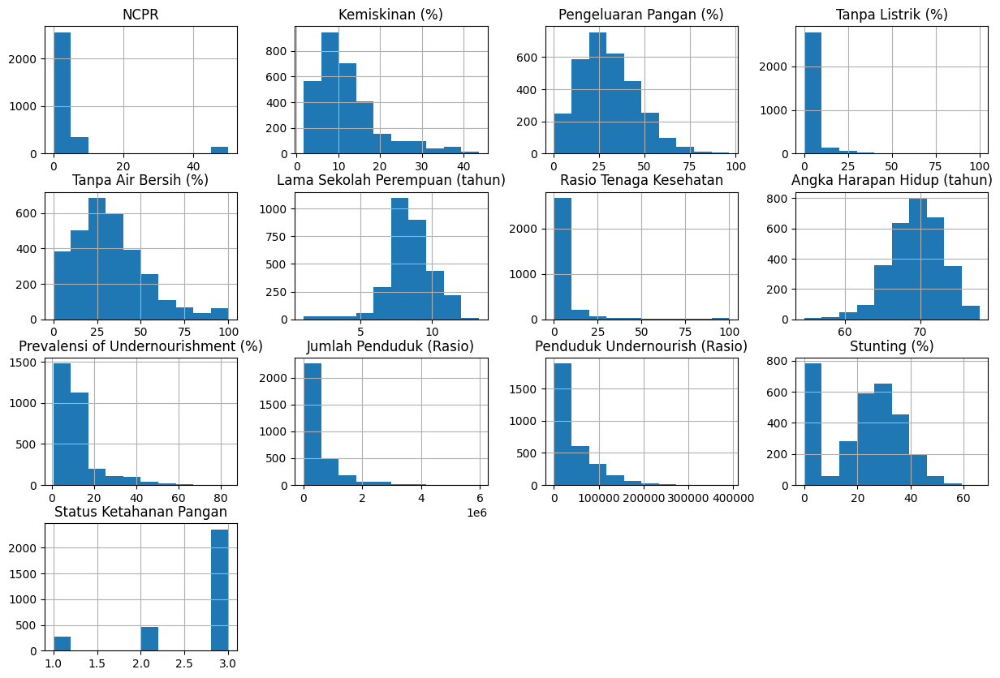

In [ ]:
# Visualize the distribution of numerical features using histograms
df.hist(figsize=(15, 10))
plt.show()

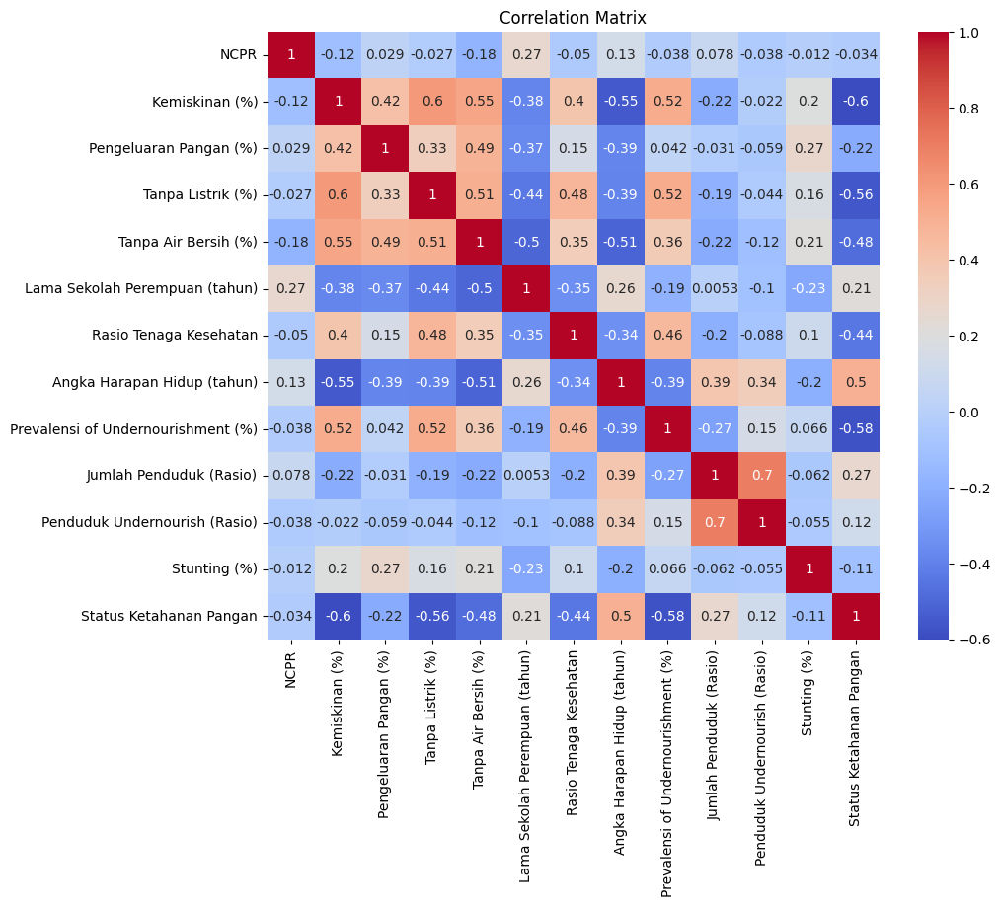

In [ ]:
# Explore correlations between numerical features
# Select only numerical columns for correlation analysis
numerical_df = df.select_dtypes(include=['number'])
correlation_matrix = numerical_df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()

In [ ]:
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 30.64it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#Outlier Handling

In [ ]:
# --- 1. Deteksi Outlier dengan IQR ---
def remove_outliers_iqr_per_category(df, category_col='Status Ketahanan Pangan'):
    df_clean = pd.DataFrame()

    for cat in df[category_col].unique():
        subset = df[df[category_col] == cat]
        numeric_cols = subset.select_dtypes(include=[np.number])

        # Hitung IQR
        Q1 = numeric_cols.quantile(0.25)
        Q3 = numeric_cols.quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Filter outlier
        mask = ~((numeric_cols < lower_bound) | (numeric_cols > upper_bound)).any(axis=1)
        df_clean = pd.concat([df_clean, subset[mask]])

    return df_clean

df_cleaned = remove_outliers_iqr_per_category(df, category_col='Status Ketahanan Pangan')

# Cek jumlah data per kategori setelah pembersihan
print(df_cleaned['Status Ketahanan Pangan'].value_counts())


Status Ketahanan Pangan
3    1436
2     294
1     148
Name: count, dtype: int64


In [ ]:
cleaned_indices = df_cleaned.index
outlier_indices = df.index.difference(cleaned_indices)

# Buat DataFrame baru yang hanya berisi data yang diidentifikasi sebagai outlier
outliers_iqr = df.loc[outlier_indices]

# Tampilkan outliers_iqr
print("\nData yang diidentifikasi sebagai outliers (IQR):")
print(outliers_iqr)

# jumlah outliers
print(f"\nJumlah outliers yang terdeteksi menggunakan IQR: {len(outliers_iqr)}")



Data yang diidentifikasi sebagai outliers (IQR):
       NCPR  Kemiskinan (%)  Pengeluaran Pangan (%)  Tanpa Listrik (%)  \
9      4.31           22.11                   40.27               1.07   
18    50.00            7.44                   43.09               0.10   
19    50.00           17.66                   58.71               0.00   
20    50.00           12.32                   51.14               0.00   
21    50.00           11.24                   49.93               0.13   
...     ...             ...                     ...                ...   
3070   0.00           11.12                    9.92               0.37   
3071   4.53           27.58                   23.45               1.54   
3072   2.20           19.90                   12.35               2.14   
3074   3.94           18.48                   17.23              20.80   
3083   0.00           14.96                    7.07               0.14   

      Tanpa Air Bersih (%)  Lama Sekolah Perempuan (tahun)  \

In [ ]:
# --- 2. Deteksi Outlier dengan Z-Score ---
def detect_outliers_zscore(df):
    # Menghitung Z-Score
    z_scores = np.abs(stats.zscore(df.select_dtypes(include=[np.number])))
    return (z_scores > 3)

outliers_zscore = detect_outliers_zscore(df)
print("Outliers based on Z-Score:", outliers_zscore.sum())


Outliers based on Z-Score: 741


In [ ]:
# --- 3. Deteksi Outlier dengan Isolation Forest ---
def detect_outliers_isolation_forest(df):
    iso_forest = IsolationForest(contamination=0.11, random_state=1111)  # 10% data dianggap outlier
    predictions = iso_forest.fit_predict(df.select_dtypes(include=[np.number]))
    return predictions == -1  # Outlier di-label dengan -1

outliers_iso_forest = detect_outliers_isolation_forest(df)
print("Outliers based on Isolation Forest:", outliers_iso_forest.sum())


Outliers based on Isolation Forest: 340


In [ ]:
# Menampilkan baris-baris data yang terdeteksi sebagai outlier
outlier_data_iso_forest = df[outliers_iso_forest]
outlier_data_iso_forest

,NCPR,Kemiskinan (%),Pengeluaran Pangan (%),Tanpa Listrik (%),Tanpa Air Bersih (%),Lama Sekolah Perempuan (tahun),Rasio Tenaga Kesehatan,Angka Harapan Hidup (tahun),Prevalensi of Undernourishment (%),Jumlah Penduduk (Rasio),Penduduk Undernourish (Rasio),Stunting (%),Status Ketahanan Pangan
18,50.0,7.44,43.09,0.10,0.82,11.86,0.02,70.96,3.52,265111,9332,25.1,3
19,50.0,17.66,58.71,0.00,9.39,11.05,0.48,70.09,5.28,34571,1825,29.8,2
22,50.0,19.71,59.43,1.16,47.90,8.06,1.00,63.56,8.04,80215,6449,47.4,1
48,50.0,9.11,47.68,0.00,4.44,11.06,0.04,72.40,4.16,2264145,94188,8.4,3
50,50.0,13.69,55.17,0.65,9.96,9.91,0.07,68.05,6.19,87317,5405,20.9,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3076,5.0,29.73,29.20,0.15,44.93,11.00,0.25,61.37,21.48,90101,19354,26.0,1
3077,5.0,30.06,40.73,14.56,78.13,10.69,0.04,60.57,28.47,44534,12679,19.1,1
3079,5.0,32.45,47.33,0.16,53.36,10.60,0.49,60.68,34.92,30606,10688,24.9,1
3080,5.0,31.14,4.13,0.17,65.54,11.83,0.09,65.53,48.23,40685,19622,17.7,1


In [ ]:
# --- 4. Deteksi Outlier dengan Local Outlier Factor (LOF) ---
def detect_outliers_lof(df):
    lof = LocalOutlierFactor(n_neighbors=20, contamination=0.1)
    predictions = lof.fit_predict(df.select_dtypes(include=[np.number]))
    return predictions == -1  # Outlier di-label dengan -1

outliers_lof = detect_outliers_lof(df)
print("Outliers based on LOF:", outliers_lof.sum())


Outliers based on LOF: 309


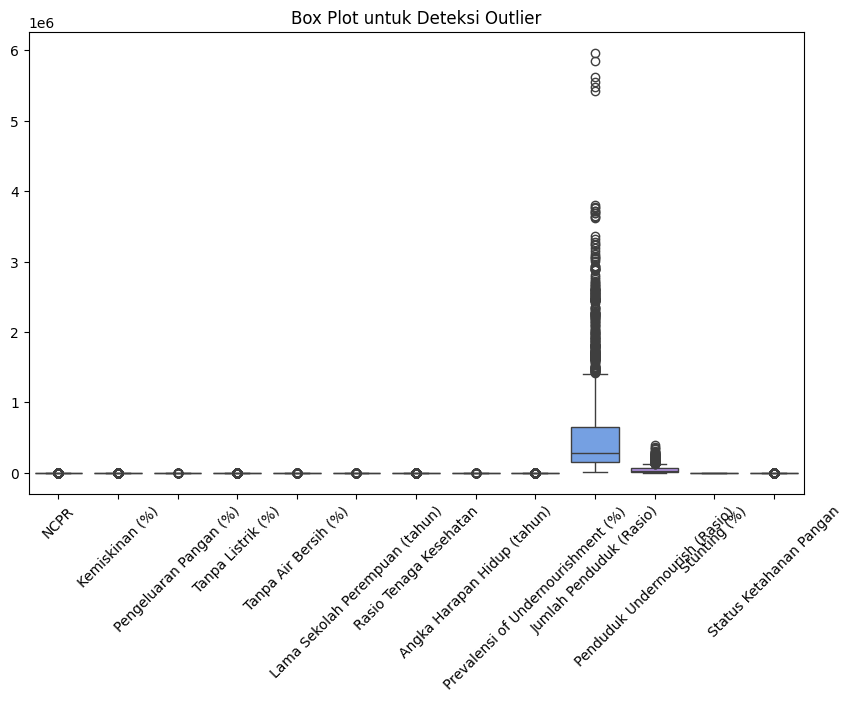

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df.select_dtypes(include=[np.number]))
plt.title("Box Plot untuk Deteksi Outlier")
plt.xticks(rotation=45) # Rotasi label sumbu x
plt.show()


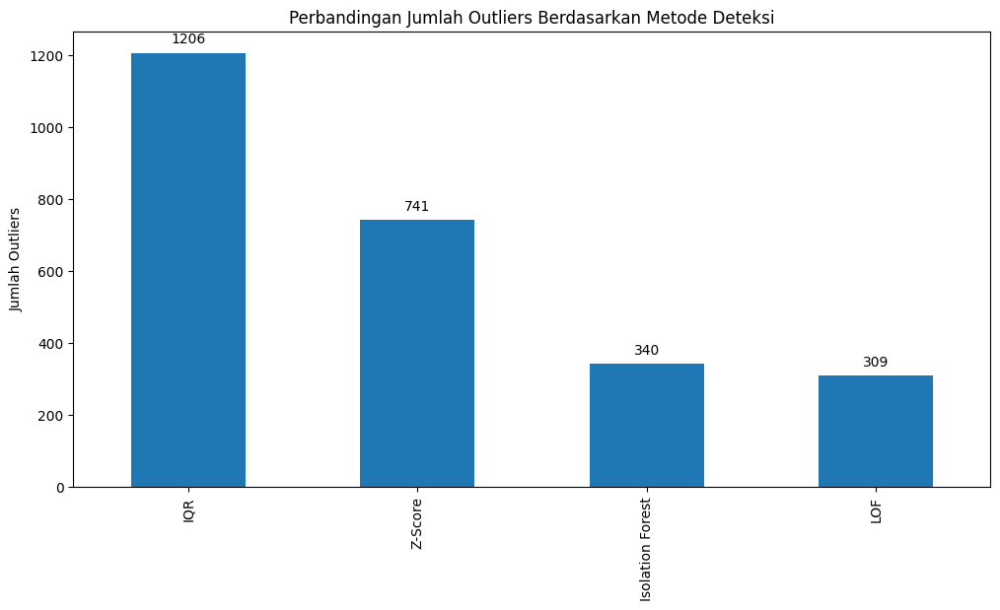

In [ ]:

df_outliers = pd.DataFrame({
    'IQR': len(outliers_iqr),
    'Z-Score': outliers_zscore.sum(),
    'Isolation Forest': outliers_iso_forest.sum(),
    'LOF': outliers_lof.sum()
}, index=[0])

# Visualisasi perbandingan deteksi outlier antara teknik
plt.figure(figsize=(12, 6))
ax = df_outliers.sum(axis=0).plot(kind='bar')
plt.title("Perbandingan Jumlah Outliers Berdasarkan Metode Deteksi")
plt.ylabel("Jumlah Outliers")

# Add labels to each bar
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.show()


In [ ]:
# Create a dictionary to store the dataframes
dfs = {}

# 1. DataFrame without outlier removal
dfs['no_outlier_removal'] = df.copy()

# 2. DataFrame with IQR outlier removal
dfs['iqr'] = df_cleaned.copy()

# 3. DataFrame with Z-score outlier removal
dfs['zscore'] = df[~outliers_zscore.any(axis=1)].copy()

# 4. DataFrame with Isolation Forest outlier removal
dfs['isolation_forest'] = df[~outliers_iso_forest].copy()

# 5. DataFrame with LOF outlier removal
dfs['lof'] = df[~outliers_lof].copy()

# Print the shapes of the dataframes to verify
for name, df_ in dfs.items():
  print(f"Shape of DataFrame ({name}): {df_.shape}")


Shape of DataFrame (no_outlier_removal): (3084, 13)
Shape of DataFrame (iqr): (1878, 13)
Shape of DataFrame (zscore): (2621, 13)
Shape of DataFrame (isolation_forest): (2744, 13)
Shape of DataFrame (lof): (2775, 13)


In [ ]:
df_outlier=dfs['no_outlier_removal']
df_no_outlier_iqr=dfs['iqr']
df_no_outlier_zscore=dfs['zscore']
df_no_outlier_isolation_forest=dfs['isolation_forest']
df_no_outlier_lof=dfs['lof']

In [ ]:
df_no_outlier_iqr

,NCPR,Kemiskinan (%),Pengeluaran Pangan (%),Tanpa Listrik (%),Tanpa Air Bersih (%),Lama Sekolah Perempuan (tahun),Rasio Tenaga Kesehatan,Angka Harapan Hidup (tahun),Prevalensi of Undernourishment (%),Jumlah Penduduk (Rasio),Penduduk Undernourish (Rasio),Stunting (%),Status Ketahanan Pangan
0,0.69,14.07,69.08,0.50,53.23,8.41,5.49,63.89,11.76,235115,27650,44.9,2
3,1.79,16.84,42.96,0.00,53.57,9.85,3.85,68.53,6.71,208505,13991,37.2,2
43,1.07,9.10,70.20,7.05,66.89,8.57,4.86,66.50,3.69,275515,10167,40.5,2
47,1.39,27.23,57.04,20.23,58.66,5.77,1.34,68.28,6.42,86195,5534,45.5,2
54,0.93,8.25,54.50,0.30,38.08,10.94,0.18,68.41,6.53,218892,14294,35.7,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3077,5.00,30.06,40.73,14.56,78.13,10.69,0.04,60.57,28.47,44534,12679,19.1,1
3078,5.00,15.29,22.37,12.46,44.43,12.06,0.09,65.27,21.91,65490,14349,21.1,1
3079,5.00,32.45,47.33,0.16,53.36,10.60,0.49,60.68,34.92,30606,10688,24.9,1
3080,5.00,31.14,4.13,0.17,65.54,11.83,0.09,65.53,48.23,40685,19622,17.7,1


# Modeling - Random Forest

## Outlier

In [ ]:
pd.set_option('display.max_colwidth', None)

In [ ]:
# Membagi data menjadi fitur (X) dan target (y)
X = df_outlier.drop(['Status Ketahanan Pangan'], axis=1)  # Menghapus target dan kolom yang tidak relevan
y = df_outlier['Status Ketahanan Pangan']  # Target tetap sama

# Membagi data menjadi data latih dan data uji
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Membuat model Random Forest
rf_model = RandomForestClassifier(random_state=42)

# Menentukan parameter grid untuk tuning
param_grid = {
    'n_estimators': [100, 200, 300],  # Jumlah pohon
    'max_depth': [10, 20],   # Kedalaman maksimal pohon
    'min_samples_split': [2, 5],   # Minimum sampel untuk membagi
    'min_samples_leaf': [2, 4],     # Minimum sampel di daun
    'max_features': ['sqrt', 'log2'],  # Fitur yang digunakan setiap split
    'bootstrap': [True]         # Menggunakan bootstrap atau tidak
}

# Membuat dataframe untuk menyimpan hasil
results_rf = pd.DataFrame(columns=["Technique", "Accuracy", "Precision (Weighted)", "Recall (Weighted)", "F1 Score (Weighted)", "Balanced Accuracy", "Best Parameters"])

# Fungsi untuk menghitung dan menyimpan hasil
def add_results_to_df(technique, X_train_resampled, y_train_resampled):
    # GridSearchCV untuk mencari hyperparameter terbaik
    grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=1)
    grid_search.fit(X_train_resampled, y_train_resampled)

    # Menyimpan best model
    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(X_test)

    # Menghitung metrik
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    balanced_accuracy = balanced_accuracy_score(y_test, y_pred)

    # Menyimpan hasil ke dalam dataframe
    results = pd.DataFrame([{
        "Technique": technique,
        "Accuracy": accuracy,
        "Precision (Weighted)": precision,
        "Recall (Weighted)": recall,
        "F1 Score (Weighted)": f1,
        "Balanced Accuracy": balanced_accuracy,
        "Best Parameters": grid_search.best_params_  # Menampilkan parameter terbaik
    }])

    # Menampilkan classification report untuk setiap teknik
    print(f"\nClassification Report for {technique}:\n")
    print(classification_report(y_test, y_pred))

    return pd.concat([results_rf, results], ignore_index=True)


# --- Tanpa Penanganan Imbalance ---
results_rf = add_results_to_df("RF Outlier - No Handling", X_train, y_train)

# --- Menggunakan SMOTE ---
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)
results_rf = add_results_to_df("RF Outlier - SMOTE", X_train_smote, y_train_smote)

# --- Menggunakan Undersampling ---
undersample = RandomUnderSampler(random_state=42)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
results_rf = add_results_to_df("RF Outlier - Undersampling", X_train_under, y_train_under)

# Menampilkan hasil dataframe
results_rf


Fitting 5 folds for each of 48 candidates, totalling 240 fits

Classification Report for RF Outlier - No Handling:

              precision    recall  f1-score   support

           1       0.95      0.91      0.93        65
           2       0.89      0.73      0.80       123
           3       0.96      0.99      0.98       738

    accuracy                           0.95       926
   macro avg       0.93      0.88      0.90       926
weighted avg       0.95      0.95      0.95       926

Fitting 5 folds for each of 48 candidates, totalling 240 fits


<ipython-input-28-d98f1255b6e8>:62: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([results_rf, results], ignore_index=True)



Classification Report for RF Outlier - SMOTE:

              precision    recall  f1-score   support

           1       0.91      0.92      0.92        65
           2       0.79      0.80      0.79       123
           3       0.97      0.97      0.97       738

    accuracy                           0.94       926
   macro avg       0.89      0.90      0.89       926
weighted avg       0.95      0.94      0.95       926

Fitting 5 folds for each of 48 candidates, totalling 240 fits

Classification Report for RF Outlier - Undersampling:

              precision    recall  f1-score   support

           1       0.90      0.97      0.93        65
           2       0.65      0.86      0.74       123
           3       0.98      0.92      0.95       738

    accuracy                           0.92       926
   macro avg       0.84      0.92      0.87       926
weighted avg       0.93      0.92      0.92       926



,Technique,Accuracy,Precision (Weighted),Recall (Weighted),F1 Score (Weighted),Balanced Accuracy,Best Parameters
0,RF Outlier - No Handling,0.952484,0.950801,0.952484,0.950350,0.877542,"{'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}"
1,RF Outlier - SMOTE,0.944924,0.945193,0.944924,0.945052,0.897123,"{'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}"
2,RF Outlier - Undersampling,0.917927,0.933336,0.917927,0.922711,0.917928,"{'bootstrap': True, 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}"


## IQR

In [ ]:
# Membagi data menjadi fitur (X) dan target (y) dengan nama variabel yang disesuaikan (df_no_outlier_iqr)
X_iqr = df_no_outlier_iqr.drop(['Status Ketahanan Pangan'], axis=1)  # Menghapus target dan kolom yang tidak relevan
y_iqr = df_no_outlier_iqr['Status Ketahanan Pangan']  # Target tetap sama

# Membagi data menjadi data latih dan data uji
X_train_iqr, X_test_iqr, y_train_iqr, y_test_iqr = train_test_split(X_iqr, y_iqr, test_size=0.3, random_state=42)

# Membuat model Random Forest
rf_model_iqr = RandomForestClassifier(random_state=42)

# Menentukan parameter grid untuk tuning
param_grid_iqr = {
    'n_estimators': [100, 200, 300],  # Jumlah pohon
    'max_depth': [10, 20],   # Kedalaman maksimal pohon
    'min_samples_split': [2, 5],   # Minimum sampel untuk membagi
    'min_samples_leaf': [2, 4],     # Minimum sampel di daun
    'max_features': ['sqrt', 'log2'],  # Fitur yang digunakan setiap split
    'bootstrap': [True]         # Menggunakan bootstrap atau tidak
}

# GridSearchCV untuk mencari parameter terbaik
grid_search_iqr = GridSearchCV(estimator=rf_model_iqr, param_grid=param_grid_iqr, cv=5, n_jobs=-1, verbose=2)

# Membuat dataframe untuk menyimpan hasil
results_rf_iqr = pd.DataFrame(columns=["Technique", "Accuracy", "Precision (Weighted)", "Recall (Weighted)", "F1 Score (Weighted)", "Balanced Accuracy", "Best Parameters"])

# Fungsi untuk menghitung dan menyimpan hasil
def add_results_to_df(technique, X_train_resampled, y_train_resampled):
    grid_search_iqr.fit(X_train_resampled, y_train_resampled)
    best_model_iqr = grid_search_iqr.best_estimator_
    y_pred_iqr = best_model_iqr.predict(X_test_iqr)

    # Menghitung metrik
    accuracy = accuracy_score(y_test_iqr, y_pred_iqr)
    precision = precision_score(y_test_iqr, y_pred_iqr, average='weighted')
    recall = recall_score(y_test_iqr, y_pred_iqr, average='weighted')
    f1 = f1_score(y_test_iqr, y_pred_iqr, average='weighted')
    balanced_accuracy = balanced_accuracy_score(y_test_iqr, y_pred_iqr)

    # Menyimpan hasil ke dalam dataframe
    results = pd.DataFrame([{
        "Technique": technique,
        "Accuracy": accuracy,
        "Precision (Weighted)": precision,
        "Recall (Weighted)": recall,
        "F1 Score (Weighted)": f1,
        "Balanced Accuracy": balanced_accuracy,
        "Best Parameters": grid_search_iqr.best_params_  # Menampilkan parameter terbaik
    }])

    # Menampilkan classification report untuk setiap teknik
    print(f"\nClassification Report for {technique}:\n")
    print(classification_report(y_test_iqr, y_pred_iqr))

    return pd.concat([results_rf_iqr, results], ignore_index=True)


# --- IQR - No Handling ---
results_rf_iqr = add_results_to_df("RF IQR - No Handling", X_train_iqr, y_train_iqr)

# --- IQR SMOTE ---
smote = SMOTE(random_state=42)
X_train_smote_iqr, y_train_smote_iqr = smote.fit_resample(X_train_iqr, y_train_iqr)
results_rf_iqr = add_results_to_df("RF IQR - SMOTE", X_train_smote_iqr, y_train_smote_iqr)

# --- IQR Undersampling ---
undersample = RandomUnderSampler(random_state=42)
X_train_under_iqr, y_train_under_iqr = undersample.fit_resample(X_train_iqr, y_train_iqr)
results_rf_iqr = add_results_to_df("RF IQR - Undersampling", X_train_under_iqr, y_train_under_iqr)

# Menampilkan hasil dataframe
results_rf_iqr


Fitting 5 folds for each of 48 candidates, totalling 240 fits

Classification Report for RF IQR - No Handling:

              precision    recall  f1-score   support

           1       0.97      0.87      0.92        45
           2       0.92      0.87      0.90        79
           3       0.98      1.00      0.99       440

    accuracy                           0.97       564
   macro avg       0.96      0.91      0.93       564
weighted avg       0.97      0.97      0.97       564

Fitting 5 folds for each of 48 candidates, totalling 240 fits


<ipython-input-30-c89fc22b3f53>:62: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([results_rf_iqr, results], ignore_index=True)



Classification Report for RF IQR - SMOTE:

              precision    recall  f1-score   support

           1       0.98      0.98      0.98        45
           2       0.89      0.91      0.90        79
           3       0.99      0.98      0.98       440

    accuracy                           0.97       564
   macro avg       0.95      0.96      0.95       564
weighted avg       0.97      0.97      0.97       564

Fitting 5 folds for each of 48 candidates, totalling 240 fits

Classification Report for RF IQR - Undersampling:

              precision    recall  f1-score   support

           1       0.98      0.98      0.98        45
           2       0.64      0.94      0.76        79
           3       0.99      0.91      0.95       440

    accuracy                           0.92       564
   macro avg       0.87      0.94      0.90       564
weighted avg       0.94      0.92      0.92       564



,Technique,Accuracy,Precision (Weighted),Recall (Weighted),F1 Score (Weighted),Balanced Accuracy,Best Parameters
0,RF IQR - No Handling,0.971631,0.971162,0.971631,0.970979,0.913361,"{'bootstrap': True, 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}"
1,RF IQR - SMOTE,0.971631,0.971977,0.971631,0.971780,0.956996,"{'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}"
2,RF IQR - Undersampling,0.918440,0.940564,0.918440,0.924343,0.941193,"{'bootstrap': True, 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}"


## Z Score

In [ ]:
# Membagi data menjadi fitur (X) dan target (y)
X_zscore = df_no_outlier_zscore.drop(['Status Ketahanan Pangan'], axis=1)  # Menghapus target dan kolom yang tidak relevan
y_zscore = df_no_outlier_zscore['Status Ketahanan Pangan']  # Target tetap sama

# Membagi data menjadi data latih dan data uji
X_train_zscore, X_test_zscore, y_train_zscore, y_test_zscore = train_test_split(X_zscore, y_zscore, test_size=0.3, random_state=42)

# Membuat model Random Forest
rf_model_zscore = RandomForestClassifier(random_state=42)

# Menentukan parameter grid untuk tuning
param_grid_zscore = {
    'n_estimators': [100, 200, 300],  # Jumlah pohon
    'max_depth': [10, 20],   # Kedalaman maksimal pohon
    'min_samples_split': [2, 5],   # Minimum sampel untuk membagi
    'min_samples_leaf': [2, 4],     # Minimum sampel di daun
    'max_features': ['sqrt', 'log2'],  # Fitur yang digunakan setiap split
    'bootstrap': [True]          # Menggunakan bootstrap atau tidak
}

# GridSearchCV untuk mencari parameter terbaik
grid_search_zscore = GridSearchCV(estimator=rf_model_zscore, param_grid=param_grid_zscore, cv=5, n_jobs=-1, verbose=2)

# Membuat dataframe untuk menyimpan hasil
results_rf_zscore = pd.DataFrame(columns=["Technique", "Accuracy", "Precision (Weighted)", "Recall (Weighted)", "F1 Score (Weighted)", "Balanced Accuracy", "Best Parameters"])

# Fungsi untuk menghitung dan menyimpan hasil
def add_results_to_df_zscore(technique, X_train_resampled, y_train_resampled):
    grid_search_zscore.fit(X_train_resampled, y_train_resampled)
    best_model_zscore = grid_search_zscore.best_estimator_
    y_pred_zscore = best_model_zscore.predict(X_test_zscore)

    # Menghitung metrik
    accuracy = accuracy_score(y_test_zscore, y_pred_zscore)
    precision = precision_score(y_test_zscore, y_pred_zscore, average='weighted')
    recall = recall_score(y_test_zscore, y_pred_zscore, average='weighted')
    f1 = f1_score(y_test_zscore, y_pred_zscore, average='weighted')
    balanced_accuracy = balanced_accuracy_score(y_test_zscore, y_pred_zscore)

    # Menyimpan hasil ke dalam dataframe, termasuk best parameters
    results = pd.DataFrame([{
        "Technique": technique,
        "Accuracy": accuracy,
        "Precision (Weighted)": precision,
        "Recall (Weighted)": recall,
        "F1 Score (Weighted)": f1,
        "Balanced Accuracy": balanced_accuracy,
        "Best Parameters": grid_search_zscore.best_params_  # Menampilkan parameter terbaik
    }])

    # Menampilkan classification report untuk setiap teknik
    print(f"\nClassification Report for {technique}:\n")
    print(classification_report(y_test_zscore, y_pred_zscore))

    return pd.concat([results_rf_zscore, results], ignore_index=True)

# --- Z-Score - No Handling ---
results_rf_zscore = add_results_to_df_zscore("RF Z-Score - No Handling", X_train_zscore, y_train_zscore)

# --- Z-Score SMOTE ---
smote = SMOTE(random_state=42)
X_train_smote_zscore, y_train_smote_zscore = smote.fit_resample(X_train_zscore, y_train_zscore)
results_rf_zscore = add_results_to_df_zscore("RF Z-Score SMOTE", X_train_smote_zscore, y_train_smote_zscore)

# --- Z-Score Undersampling ---
undersample = RandomUnderSampler(random_state=42)
X_train_under_zscore, y_train_under_zscore = undersample.fit_resample(X_train_zscore, y_train_zscore)
results_rf_zscore = add_results_to_df_zscore("RF Z-Score Undersampling", X_train_under_zscore, y_train_under_zscore)

# Menampilkan hasil dataframe
results_rf_zscore


Fitting 5 folds for each of 48 candidates, totalling 240 fits

Classification Report for RF Z-Score - No Handling:

              precision    recall  f1-score   support

           1       0.93      0.76      0.84        34
           2       0.88      0.73      0.80       135
           3       0.94      0.99      0.97       618

    accuracy                           0.93       787
   macro avg       0.92      0.83      0.87       787
weighted avg       0.93      0.93      0.93       787

Fitting 5 folds for each of 48 candidates, totalling 240 fits


<ipython-input-31-94fc68f44d93>:62: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([results_rf_zscore, results], ignore_index=True)



Classification Report for RF Z-Score SMOTE:

              precision    recall  f1-score   support

           1       0.84      0.79      0.82        34
           2       0.80      0.81      0.80       135
           3       0.96      0.96      0.96       618

    accuracy                           0.93       787
   macro avg       0.87      0.86      0.86       787
weighted avg       0.93      0.93      0.93       787

Fitting 5 folds for each of 48 candidates, totalling 240 fits

Classification Report for RF Z-Score Undersampling:

              precision    recall  f1-score   support

           1       0.71      0.88      0.79        34
           2       0.62      0.81      0.70       135
           3       0.98      0.90      0.94       618

    accuracy                           0.88       787
   macro avg       0.77      0.86      0.81       787
weighted avg       0.90      0.88      0.89       787



,Technique,Accuracy,Precision (Weighted),Recall (Weighted),F1 Score (Weighted),Balanced Accuracy,Best Parameters
0,RF Z-Score - No Handling,0.933926,0.931987,0.933926,0.930875,0.826435,"{'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}"
1,RF Z-Score SMOTE,0.930114,0.930017,0.930114,0.930031,0.855309,"{'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}"
2,RF Z-Score Undersampling,0.881830,0.903034,0.881830,0.888670,0.862606,"{'bootstrap': True, 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 300}"


## Isolation Forest

In [ ]:
# Membagi data menjadi fitur (X) dan target (y)
X_if = df_no_outlier_isolation_forest.drop(['Status Ketahanan Pangan'], axis=1)
y_if = df_no_outlier_isolation_forest['Status Ketahanan Pangan']

# Membagi data menjadi data latih dan uji
X_train_if, X_test_if, y_train_if, y_test_if = train_test_split(X_if, y_if, test_size=0.3, random_state=42)

# Model dan parameter grid
rf_model_if = RandomForestClassifier(random_state=42)
param_grid_if = {
    'n_estimators': [100, 200, 300],  # Jumlah pohon
    'max_depth': [10, 20],   # Kedalaman maksimal pohon
    'min_samples_split': [2, 5],   # Minimum sampel untuk membagi
    'min_samples_leaf': [2, 4],     # Minimum sampel di daun
    'max_features': ['sqrt', 'log2'],  # Fitur yang digunakan setiap split
    'bootstrap': [True]
}

# Inisialisasi GridSearch
grid_search_if = GridSearchCV(estimator=rf_model_if, param_grid=param_grid_if, cv=5, n_jobs=-1, verbose=2)

# DataFrame hasil
results_rf_if = pd.DataFrame(columns=["Technique", "Accuracy", "Precision (Weighted)", "Recall (Weighted)", "F1 Score (Weighted)", "Balanced Accuracy", "Best Parameters"])

# Fungsi evaluasi dan penyimpanan hasil
def add_results_to_df(technique, X_train_resampled, y_train_resampled):
    grid_search_if.fit(X_train_resampled, y_train_resampled)
    best_model_if = grid_search_if.best_estimator_
    y_pred_if = best_model_if.predict(X_test_if)

    accuracy = accuracy_score(y_test_if, y_pred_if)
    precision = precision_score(y_test_if, y_pred_if, average='weighted')
    recall = recall_score(y_test_if, y_pred_if, average='weighted')
    f1 = f1_score(y_test_if, y_pred_if, average='weighted')
    balanced_accuracy = balanced_accuracy_score(y_test_if, y_pred_if)

    results = pd.DataFrame([{
        "Technique": technique,
        "Accuracy": accuracy,
        "Precision (Weighted)": precision,
        "Recall (Weighted)": recall,
        "F1 Score (Weighted)": f1,
        "Balanced Accuracy": balanced_accuracy,
        "Best Parameters": grid_search_if.best_params_
    }])

    print(f"\nClassification Report for {technique}:\n")
    print(classification_report(y_test_if, y_pred_if))

    return pd.concat([results_rf_if, results], ignore_index=True)

# --- Tanpa Penanganan Imbalance ---
results_rf_if = add_results_to_df("RF IF Outlier - No Handling", X_train_if, y_train_if)

# --- Menggunakan SMOTE ---
smote = SMOTE(random_state=42)
X_train_smote_if, y_train_smote_if = smote.fit_resample(X_train_if, y_train_if)
results_rf_if = add_results_to_df("RF IF - SMOTE", X_train_smote_if, y_train_smote_if)

# --- Menggunakan Undersampling ---
undersample = RandomUnderSampler(random_state=42)
X_train_under_if, y_train_under_if = undersample.fit_resample(X_train_if, y_train_if)
results_rf_if = add_results_to_df("RF IF - Undersampling", X_train_under_if, y_train_under_if)

# Tampilkan hasil
results_rf_if


Fitting 5 folds for each of 48 candidates, totalling 240 fits

Classification Report for RF IF Outlier - No Handling:

              precision    recall  f1-score   support

           1       0.92      0.57      0.71        21
           2       0.87      0.71      0.79       126
           3       0.95      0.99      0.97       677

    accuracy                           0.94       824
   macro avg       0.92      0.76      0.82       824
weighted avg       0.94      0.94      0.94       824

Fitting 5 folds for each of 48 candidates, totalling 240 fits


<ipython-input-32-9923667db048>:58: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([results_rf_if, results], ignore_index=True)



Classification Report for RF IF - SMOTE:

              precision    recall  f1-score   support

           1       0.77      0.81      0.79        21
           2       0.79      0.82      0.80       126
           3       0.97      0.97      0.97       677

    accuracy                           0.94       824
   macro avg       0.85      0.86      0.85       824
weighted avg       0.94      0.94      0.94       824

Fitting 5 folds for each of 48 candidates, totalling 240 fits

Classification Report for RF IF - Undersampling:

              precision    recall  f1-score   support

           1       0.47      0.86      0.61        21
           2       0.49      0.63      0.55       126
           3       0.96      0.88      0.92       677

    accuracy                           0.84       824
   macro avg       0.64      0.79      0.69       824
weighted avg       0.87      0.84      0.85       824



,Technique,Accuracy,Precision (Weighted),Recall (Weighted),F1 Score (Weighted),Balanced Accuracy,Best Parameters
0,RF IF Outlier - No Handling,0.940534,0.938124,0.940534,0.936650,0.759935,"{'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}"
1,RF IF - SMOTE,0.939320,0.940442,0.939320,0.939829,0.864337,"{'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 300}"
2,RF IF - Undersampling,0.842233,0.871898,0.842233,0.853183,0.788653,"{'bootstrap': True, 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}"


## LOF

In [ ]:
# Membagi data menjadi fitur (X) dan target (y)
X_lof = df_no_outlier_lof.drop(['Status Ketahanan Pangan'], axis=1)  # Menghapus target dan kolom yang tidak relevan
y_lof = df_no_outlier_lof['Status Ketahanan Pangan']  # Target tetap sama

# Membagi data menjadi data latih dan data uji
X_train_lof, X_test_lof, y_train_lof, y_test_lof = train_test_split(X_lof, y_lof, test_size=0.3, random_state=42)

# Membuat model Random Forest
rf_model_lof = RandomForestClassifier(random_state=42)

# Menentukan parameter grid untuk tuning
param_grid_lof = {
    'n_estimators': [100, 200, 300],  # Jumlah pohon
    'max_depth': [10, 20],   # Kedalaman maksimal pohon
    'min_samples_split': [2, 5],   # Minimum sampel untuk membagi
    'min_samples_leaf': [2, 4],     # Minimum sampel di daun
    'max_features': ['sqrt', 'log2'],  # Fitur yang digunakan setiap split
    'bootstrap': [True]        # Menggunakan bootstrap atau tidak
}

# GridSearchCV untuk mencari parameter terbaik
grid_search_lof = GridSearchCV(estimator=rf_model_lof, param_grid=param_grid_lof, cv=5, n_jobs=-1, verbose=2)

# Membuat dataframe untuk menyimpan hasil
results_rf_lof = pd.DataFrame(columns=["Technique", "Accuracy", "Precision (Weighted)", "Recall (Weighted)", "F1 Score (Weighted)", "Balanced Accuracy", "Best Parameters"])

# Fungsi untuk menghitung dan menyimpan hasil
def add_results_to_df(technique, X_train_resampled, y_train_resampled):
    grid_search_lof.fit(X_train_resampled, y_train_resampled)
    best_model_lof = grid_search_lof.best_estimator_
    y_pred_lof = best_model_lof.predict(X_test_lof)

    # Menghitung metrik
    accuracy = accuracy_score(y_test_lof, y_pred_lof)
    precision = precision_score(y_test_lof, y_pred_lof, average='weighted')
    recall = recall_score(y_test_lof, y_pred_lof, average='weighted')
    f1 = f1_score(y_test_lof, y_pred_lof, average='weighted')
    balanced_accuracy = balanced_accuracy_score(y_test_lof, y_pred_lof)

    # Menyimpan hasil ke dalam dataframe, termasuk best parameters
    results = pd.DataFrame([{
        "Technique": technique,
        "Accuracy": accuracy,
        "Precision (Weighted)": precision,
        "Recall (Weighted)": recall,
        "F1 Score (Weighted)": f1,
        "Balanced Accuracy": balanced_accuracy,
        "Best Parameters": grid_search_lof.best_params_  # Menampilkan parameter terbaik
    }])

    # Menampilkan classification report untuk setiap teknik
    print(f"\nClassification Report for {technique}:\n")
    print(classification_report(y_test_lof, y_pred_lof))

    return pd.concat([results_rf_lof, results], ignore_index=True)

# --- LOF - No Handling ---
results_rf_lof = add_results_to_df("RF LOF - No Handling", X_train_lof, y_train_lof)

# --- LOF SMOTE ---
smote = SMOTE(random_state=42)
X_train_smote_lof, y_train_smote_lof = smote.fit_resample(X_train_lof, y_train_lof)
results_rf_lof = add_results_to_df("RF LOF SMOTE", X_train_smote_lof, y_train_smote_lof)

# --- LOF Undersampling ---
undersample = RandomUnderSampler(random_state=42)
X_train_under_lof, y_train_under_lof = undersample.fit_resample(X_train_lof, y_train_lof)
results_rf_lof = add_results_to_df("RF LOF Undersampling", X_train_under_lof, y_train_under_lof)

results_rf_lof


Fitting 5 folds for each of 48 candidates, totalling 240 fits

Classification Report for RF LOF - No Handling:

              precision    recall  f1-score   support

           1       0.96      0.83      0.89        59
           2       0.83      0.72      0.77       119
           3       0.95      0.99      0.97       655

    accuracy                           0.94       833
   macro avg       0.91      0.85      0.88       833
weighted avg       0.94      0.94      0.94       833

Fitting 5 folds for each of 48 candidates, totalling 240 fits


<ipython-input-33-624a112ebed9>:62: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([results_rf_lof, results], ignore_index=True)



Classification Report for RF LOF SMOTE:

              precision    recall  f1-score   support

           1       0.95      0.90      0.92        59
           2       0.74      0.83      0.79       119
           3       0.97      0.96      0.97       655

    accuracy                           0.94       833
   macro avg       0.89      0.90      0.89       833
weighted avg       0.94      0.94      0.94       833

Fitting 5 folds for each of 48 candidates, totalling 240 fits

Classification Report for RF LOF Undersampling:

              precision    recall  f1-score   support

           1       0.93      0.92      0.92        59
           2       0.60      0.86      0.71       119
           3       0.98      0.90      0.94       655

    accuracy                           0.90       833
   macro avg       0.84      0.89      0.86       833
weighted avg       0.92      0.90      0.90       833



,Technique,Accuracy,Precision (Weighted),Recall (Weighted),F1 Score (Weighted),Balanced Accuracy,Best Parameters
0,RF LOF - No Handling,0.937575,0.935385,0.937575,0.935417,0.846486,"{'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}"
1,RF LOF SMOTE,0.935174,0.938929,0.935174,0.936605,0.895830,"{'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}"
2,RF LOF Undersampling,0.896759,0.919777,0.896759,0.903858,0.891562,"{'bootstrap': True, 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}"


## Comparision

In [ ]:
# Combine the dataframes
combined_results = pd.concat([results_rf, results_rf_iqr, results_rf_zscore, results_rf_if, results_rf_lof], ignore_index=True)

# Sort by 'Balanced Accuracy' in descending order
combined_results = combined_results.sort_values(by='F1 Score (Weighted)', ascending=False)

# Reset the index
combined_results = combined_results.reset_index(drop=True)

# Display the combined and sorted dataframe
combined_results


,Technique,Accuracy,Precision (Weighted),Recall (Weighted),F1 Score (Weighted),Balanced Accuracy,Best Parameters
0,RF IQR - SMOTE,0.971631,0.971977,0.971631,0.971780,0.956996,"{'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}"
1,RF IQR - No Handling,0.971631,0.971162,0.971631,0.970979,0.913361,"{'bootstrap': True, 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}"
2,RF Outlier - No Handling,0.952484,0.950801,0.952484,0.950350,0.877542,"{'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}"
3,RF Outlier - SMOTE,0.944924,0.945193,0.944924,0.945052,0.897123,"{'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}"
4,RF IF - SMOTE,0.939320,0.940442,0.939320,0.939829,0.864337,"{'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 300}"
5,RF IF Outlier - No Handling,0.940534,0.938124,0.940534,0.936650,0.759935,"{'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}"
6,RF LOF SMOTE,0.935174,0.938929,0.935174,0.936605,0.895830,"{'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}"
7,RF LOF - No Handling,0.937575,0.935385,0.937575,0.935417,0.846486,"{'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}"
8,RF Z-Score - No Handling,0.933926,0.931987,0.933926,0.930875,0.826435,"{'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}"
9,RF Z-Score SMOTE,0.930114,0.930017,0.930114,0.930031,0.855309,"{'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}"


# Modeling - LightGBM



## Outlier

In [ ]:
# Membagi data menjadi fitur (X) dan target (y)
X = df_outlier.drop(['Status Ketahanan Pangan'], axis=1)  # Menghapus target dan kolom yang tidak relevan
y = df_outlier['Status Ketahanan Pangan']  # Target tetap sama

# Membagi data menjadi data latih dan data uji
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Membuat model LightGBM
lgbm_model = lgb.LGBMClassifier(random_state=42)

# Menentukan parameter grid untuk tuning
param_grid = {
    'n_estimators': [100, 200],        # Jumlah pohon
    'learning_rate': [0.01, 0.05],     # Besar langkah pengurangan error
    'max_depth': [10, 20],             # Kedalaman maksimum pohon
    'num_leaves': [31, 63],            # Jumlah daun maksimum
    'subsample': [0.8],                # Rasio subsample data
    'colsample_bytree': [0.8],         # Rasio fitur subsample per pohon
    'min_child_samples': [20]          # Minimum sampel per daun
}

# Membuat dataframe untuk menyimpan hasil
results_lgbm = pd.DataFrame(columns=["Technique", "Accuracy", "Precision (Weighted)", "Recall (Weighted)", "F1 Score (Weighted)", "Balanced Accuracy", "Best Parameters"])

# Fungsi untuk menghitung dan menyimpan hasil
def add_results_to_df(technique, X_train_resampled, y_train_resampled):
    # GridSearchCV untuk mencari hyperparameter terbaik
    grid_search = GridSearchCV(estimator=lgbm_model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=1)
    grid_search.fit(X_train_resampled, y_train_resampled)

    # Menyimpan best model
    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(X_test)

    # Menghitung metrik
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    balanced_accuracy = balanced_accuracy_score(y_test, y_pred)

    # Menyimpan hasil ke dalam dataframe
    results = pd.DataFrame([{
        "Technique": technique,
        "Accuracy": accuracy,
        "Precision (Weighted)": precision,
        "Recall (Weighted)": recall,
        "F1 Score (Weighted)": f1,
        "Balanced Accuracy": balanced_accuracy,
        "Best Parameters": grid_search.best_params_  # Menampilkan parameter terbaik
    }])

    # Menampilkan classification report untuk setiap teknik
    print(f"\nClassification Report for {technique}:\n")
    print(classification_report(y_test, y_pred))

    return pd.concat([results_lgbm, results], ignore_index=True)

# --- Tanpa Penanganan Imbalance ---
results_lgbm = add_results_to_df("LGBM Outlier - No Handling", X_train, y_train)

# --- Menggunakan SMOTE ---
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)
results_lgbm = add_results_to_df("LGBM Outlier - SMOTE", X_train_smote, y_train_smote)

# --- Menggunakan Undersampling ---
undersample = RandomUnderSampler(random_state=42)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
results_lgbm = add_results_to_df("LGBM Outlier - Undersampling", X_train_under, y_train_under)

# Menampilkan hasil dataframe
results_lgbm

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3060
[LightGBM] [Info] Number of data points in the train set: 2158, number of used features: 12
[LightGBM] [Info] Start training from score -2.353927
[LightGBM] [Info] Start training from score -1.868795
[LightGBM] [Info] Start training from score -0.286756
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Classification Report for LGBM Outlier - No Handling:

              precision    recall  f1-score   support

           1       0.97      0.98      0.98        65
           2       0.94      0.80      0.86       123
           3       0.97      0.99      0.98       738

    accuracy                           0.97       926
   mac

<ipython-input-24-e84a12791614>:65: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([results_lgbm, results], ignore_index=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000798 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3060
[LightGBM] [Info] Number of data points in the train set: 4860, number of used features: 12
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Classification Report for LGBM Outlier - SMOTE:

              precision    recall  f1-score   support

           1       0.94      0.97      0.95        65
           2       0.84      0.83      0.84       123
           3       0.98      0.98      0.98       738

    accuracy                           0.96       92

,Technique,Accuracy,Precision (Weighted),Recall (Weighted),F1 Score (Weighted),Balanced Accuracy,Best Parameters
0,LGBM Outlier - No Handling,0.966523,0.965963,0.966523,0.965316,0.924863,"{'colsample_bytree': 0.8, 'learning_rate': 0.0..."
1,LGBM Outlier - SMOTE,0.956803,0.956593,0.956803,0.956676,0.925155,"{'colsample_bytree': 0.8, 'learning_rate': 0.0..."
2,LGBM Outlier - Undersampling,0.935205,0.943934,0.935205,0.937942,0.932090,"{'colsample_bytree': 0.8, 'learning_rate': 0.0..."


## IQR

In [ ]:
# Membagi data menjadi fitur (X) dan target (y) dengan nama variabel yang disesuaikan (df_no_outlier_iqr)
X_iqr = df_no_outlier_iqr.drop(['Status Ketahanan Pangan'], axis=1)
y_iqr = df_no_outlier_iqr['Status Ketahanan Pangan']

# Membagi data menjadi data latih dan data uji
X_train_iqr, X_test_iqr, y_train_iqr, y_test_iqr = train_test_split(X_iqr, y_iqr, test_size=0.3, random_state=42)

# Membuat model LightGBM
lgbm_model_iqr = lgb.LGBMClassifier(random_state=42)

# Menentukan parameter grid untuk tuning
param_grid_iqr = {
    'n_estimators': [100, 200],        # Jumlah pohon
    'learning_rate': [0.01, 0.05],     # Besar langkah pengurangan error
    'max_depth': [10, 20],             # Kedalaman maksimum pohon
    'num_leaves': [31, 63],            # Jumlah daun maksimum
    'subsample': [0.8],                # Rasio subsample data
    'colsample_bytree': [0.8],         # Rasio fitur subsample per pohon
    'min_child_samples': [20]          # Minimum sampel per daun
}

# GridSearchCV untuk mencari parameter terbaik
grid_search_iqr = GridSearchCV(estimator=lgbm_model_iqr, param_grid=param_grid_iqr, cv=5, n_jobs=-1, verbose=2)

# Membuat dataframe untuk menyimpan hasil
results_lgbm_iqr = pd.DataFrame(columns=["Technique", "Accuracy", "Precision (Weighted)", "Recall (Weighted)", "F1 Score (Weighted)", "Balanced Accuracy", "Best Parameters"])

# Fungsi untuk menghitung dan menyimpan hasil
def add_results_to_df(technique, X_train_resampled, y_train_resampled):
    grid_search_iqr.fit(X_train_resampled, y_train_resampled)
    best_model_iqr = grid_search_iqr.best_estimator_
    y_pred_iqr = best_model_iqr.predict(X_test_iqr)

    # Menghitung metrik
    accuracy = accuracy_score(y_test_iqr, y_pred_iqr)
    precision = precision_score(y_test_iqr, y_pred_iqr, average='weighted')
    recall = recall_score(y_test_iqr, y_pred_iqr, average='weighted')
    f1 = f1_score(y_test_iqr, y_pred_iqr, average='weighted')
    balanced_accuracy = balanced_accuracy_score(y_test_iqr, y_pred_iqr)

    # Menyimpan hasil ke dalam dataframe
    results = pd.DataFrame([{
        "Technique": technique,
        "Accuracy": accuracy,
        "Precision (Weighted)": precision,
        "Recall (Weighted)": recall,
        "F1 Score (Weighted)": f1,
        "Balanced Accuracy": balanced_accuracy,
        "Best Parameters": grid_search_iqr.best_params_
    }])

    # Menampilkan classification report untuk setiap teknik
    print(f"\nClassification Report for {technique}:\n")
    print(classification_report(y_test_iqr, y_pred_iqr))

    return pd.concat([results_lgbm_iqr, results], ignore_index=True)

# --- IQR - No Handling ---
results_lgbm_iqr = add_results_to_df("LGBM IQR - No Handling", X_train_iqr, y_train_iqr)

# --- IQR SMOTE ---
smote = SMOTE(random_state=42)
X_train_smote_iqr, y_train_smote_iqr = smote.fit_resample(X_train_iqr, y_train_iqr)
results_lgbm_iqr = add_results_to_df("LGBM IQR - SMOTE", X_train_smote_iqr, y_train_smote_iqr)

# --- IQR Undersampling ---
undersample = RandomUnderSampler(random_state=42)
X_train_under_iqr, y_train_under_iqr = undersample.fit_resample(X_train_iqr, y_train_iqr)
results_lgbm_iqr = add_results_to_df("LGBM IQR - Undersampling", X_train_under_iqr, y_train_under_iqr)

# Menampilkan hasil dataframe
results_lgbm_iqr

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2968
[LightGBM] [Info] Number of data points in the train set: 1314, number of used features: 12
[LightGBM] [Info] Start training from score -2.546102
[LightGBM] [Info] Start training from score -1.810193
[LightGBM] [Info] Start training from score -0.277084
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

<ipython-input-29-26fc63819aa0>:64: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([results_lgbm_iqr, results], ignore_index=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3060
[LightGBM] [Info] Number of data points in the train set: 2988, number of used features: 12
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

,Technique,Accuracy,Precision (Weighted),Recall (Weighted),F1 Score (Weighted),Balanced Accuracy,Best Parameters
0,LGBM IQR - No Handling,0.984043,0.983906,0.984043,0.983788,0.955649,"{'colsample_bytree': 0.8, 'learning_rate': 0.0..."
1,LGBM IQR - SMOTE,0.976950,0.977421,0.976950,0.977132,0.966193,"{'colsample_bytree': 0.8, 'learning_rate': 0.0..."
2,LGBM IQR - Undersampling,0.930851,0.946538,0.930851,0.935095,0.946496,"{'colsample_bytree': 0.8, 'learning_rate': 0.0..."


## Z Score

In [ ]:
# Membagi data menjadi fitur (X) dan target (y)
X_zscore = df_no_outlier_zscore.drop(['Status Ketahanan Pangan'], axis=1)
y_zscore = df_no_outlier_zscore['Status Ketahanan Pangan']

# Membagi data menjadi data latih dan data uji
X_train_zscore, X_test_zscore, y_train_zscore, y_test_zscore = train_test_split(X_zscore, y_zscore, test_size=0.3, random_state=42)

# Membuat model LightGBM
lgbm_model_zscore = lgb.LGBMClassifier(random_state=42)

# Menentukan parameter grid untuk tuning
param_grid_zscore = {
    'n_estimators': [100, 200],        # Jumlah pohon
    'learning_rate': [0.01, 0.05],     # Besar langkah pengurangan error
    'max_depth': [10, 20],             # Kedalaman maksimum pohon
    'num_leaves': [31, 63],            # Jumlah daun maksimum
    'subsample': [0.8],                # Rasio subsample data
    'colsample_bytree': [0.8],         # Rasio fitur subsample per pohon
    'min_child_samples': [20]          # Minimum sampel per daun
}

# GridSearchCV untuk mencari parameter terbaik
grid_search_zscore = GridSearchCV(estimator=lgbm_model_zscore, param_grid=param_grid_zscore, cv=5, n_jobs=-1, verbose=2)

# Membuat dataframe untuk menyimpan hasil
results_lgbm_zscore = pd.DataFrame(columns=["Technique", "Accuracy", "Precision (Weighted)", "Recall (Weighted)", "F1 Score (Weighted)", "Balanced Accuracy", "Best Parameters"])

# Fungsi untuk menghitung dan menyimpan hasil
def add_results_to_df_zscore(technique, X_train_resampled, y_train_resampled):
    grid_search_zscore.fit(X_train_resampled, y_train_resampled)
    best_model_zscore = grid_search_zscore.best_estimator_
    y_pred_zscore = best_model_zscore.predict(X_test_zscore)

    # Menghitung metrik
    accuracy = accuracy_score(y_test_zscore, y_pred_zscore)
    precision = precision_score(y_test_zscore, y_pred_zscore, average='weighted')
    recall = recall_score(y_test_zscore, y_pred_zscore, average='weighted')
    f1 = f1_score(y_test_zscore, y_pred_zscore, average='weighted')
    balanced_accuracy = balanced_accuracy_score(y_test_zscore, y_pred_zscore)

    # Menyimpan hasil ke dalam dataframe
    results = pd.DataFrame([{
        "Technique": technique,
        "Accuracy": accuracy,
        "Precision (Weighted)": precision,
        "Recall (Weighted)": recall,
        "F1 Score (Weighted)": f1,
        "Balanced Accuracy": balanced_accuracy,
        "Best Parameters": grid_search_zscore.best_params_
    }])

    # Menampilkan classification report untuk setiap teknik
    print(f"\nClassification Report for {technique}:\n")
    print(classification_report(y_test_zscore, y_pred_zscore))

    return pd.concat([results_lgbm_zscore, results], ignore_index=True)

# --- Z-Score - No Handling ---
results_lgbm_zscore = add_results_to_df_zscore("LGBM Z-Score - No Handling", X_train_zscore, y_train_zscore)

# --- Z-Score SMOTE ---
smote = SMOTE(random_state=42)
X_train_smote_zscore, y_train_smote_zscore = smote.fit_resample(X_train_zscore, y_train_zscore)
results_lgbm_zscore = add_results_to_df_zscore("LGBM Z-Score - SMOTE", X_train_smote_zscore, y_train_smote_zscore)

# --- Z-Score Undersampling ---
undersample = RandomUnderSampler(random_state=42)
X_train_under_zscore, y_train_under_zscore = undersample.fit_resample(X_train_zscore, y_train_zscore)
results_lgbm_zscore = add_results_to_df_zscore("LGBM Z-Score - Undersampling", X_train_under_zscore, y_train_under_zscore)

# Menampilkan hasil dataframe
results_lgbm_zscore

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3060
[LightGBM] [Info] Number of data points in the train set: 1834, number of used features: 12
[LightGBM] [Info] Start training from score -3.014445
[LightGBM] [Info] Start training from score -1.901127
[LightGBM] [Info] Start training from score -0.221237
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

<ipython-input-37-4510a78ae277>:64: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([results_lgbm_zscore, results], ignore_index=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3060
[LightGBM] [Info] Number of data points in the train set: 4410, number of used features: 12
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Classification Report for LGBM Z-Score - SMOTE:

              precision    recall  f1-score   support

           1       0.90      0.82      0.86        34
           2       0.87      0.81      0.84       135
           3       0.96      0.98      0.97       618

    accuracy                           0.95       787
   macro avg       0.91      0.87      0.89       787
weighted avg       

,Technique,Accuracy,Precision (Weighted),Recall (Weighted),F1 Score (Weighted),Balanced Accuracy,Best Parameters
0,LGBM Z-Score - No Handling,0.949174,0.948290,0.949174,0.946827,0.861085,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 20, 'n_estimators': 200, 'num_leaves': 63, 'subsample': 0.8}"
1,LGBM Z-Score - SMOTE,0.945362,0.943995,0.945362,0.944303,0.871046,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 20, 'n_estimators': 200, 'num_leaves': 63, 'subsample': 0.8}"
2,LGBM Z-Score - Undersampling,0.872935,0.896262,0.872935,0.880781,0.839917,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 20, 'n_estimators': 200, 'num_leaves': 31, 'subsample': 0.8}"


## Isolation Forest

In [ ]:
# Membagi data menjadi fitur (X) dan target (y)
X_if = df_no_outlier_isolation_forest.drop(['Status Ketahanan Pangan'], axis=1)
y_if = df_no_outlier_isolation_forest['Status Ketahanan Pangan']
X_train_if, X_test_if, y_train_if, y_test_if = train_test_split(X_if, y_if, test_size=0.3, random_state=100)

# Model dan parameter grid
lgbm_model_if = lgb.LGBMClassifier(random_state=42)
param_grid_if = {
    'n_estimators': [100, 200],        # Jumlah pohon
    'learning_rate': [0.01, 0.05],     # Besar langkah pengurangan error
    'max_depth': [10, 20],             # Kedalaman maksimum pohon
    'num_leaves': [31, 63],            # Jumlah daun maksimum
    'subsample': [0.8],                # Rasio subsample data
    'colsample_bytree': [0.8],         # Rasio fitur subsample per pohon
    'min_child_samples': [20]            # Kontrol minimum data dalam leaf → pengaruh besar ke generalisasi
}

# DataFrame hasil
results_lgbm_if = pd.DataFrame(columns=["Technique", "Accuracy", "Precision (Weighted)",
                                      "Recall (Weighted)", "F1 Score (Weighted)",
                                      "Balanced Accuracy", "Best Parameters"])

# Fungsi evaluasi + auto-cv
def add_results_to_df(technique, X_train_resampled, y_train_resampled):
    # Hitung jumlah minimum kelas
    min_class_count = min(Counter(y_train_resampled).values())
    cv_value = min(5, min_class_count)
    print(f"\n[INFO] Technique: {technique} → min_class_count = {min_class_count}, cv = {cv_value}")

    grid_search_if = GridSearchCV(
        estimator=lgbm_model_if,
        param_grid=param_grid_if,
        cv=cv_value,
        n_jobs=-1,
        verbose=2,
        scoring='accuracy'
    )

    grid_search_if.fit(X_train_resampled, y_train_resampled)
    best_model_if = grid_search_if.best_estimator_
    y_pred_if = best_model_if.predict(X_test_if)

    accuracy = accuracy_score(y_test_if, y_pred_if)
    precision = precision_score(y_test_if, y_pred_if, average='weighted')
    recall = recall_score(y_test_if, y_pred_if, average='weighted')
    f1 = f1_score(y_test_if, y_pred_if, average='weighted')
    balanced_accuracy = balanced_accuracy_score(y_test_if, y_pred_if)

    results = pd.DataFrame([{
        "Technique": technique,
        "Accuracy": accuracy,
        "Precision (Weighted)": precision,
        "Recall (Weighted)": recall,
        "F1 Score (Weighted)": f1,
        "Balanced Accuracy": balanced_accuracy,
        "Best Parameters": grid_search_if.best_params_
    }])

    print(f"\nClassification Report for {technique}:\n")
    print(classification_report(y_test_if, y_pred_if))

    return pd.concat([results_lgbm_if, results], ignore_index=True)

# --- Tanpa Penanganan Imbalance ---
results_lgbm_if = add_results_to_df("LGBM IF Outlier - No Handling", X_train_if, y_train_if)

# --- SMOTE (dengan aman untuk dataset kecil)
smote = SMOTE(random_state=42, k_neighbors=1)
X_train_smote_if, y_train_smote_if = smote.fit_resample(X_train_if, y_train_if)
results_lgbm_if = add_results_to_df("LGBM IF - SMOTE", X_train_smote_if, y_train_smote_if)

# --- Random UnderSampling
undersample = RandomUnderSampler(random_state=42)
X_train_under_if, y_train_under_if = undersample.fit_resample(X_train_if, y_train_if)
results_lgbm_if = add_results_to_df("LGBM IF - Undersampling", X_train_under_if, y_train_under_if)

# Tampilkan hasil akhir
results_lgbm_if


[INFO] Technique: LGBM IF Outlier - No Handling → min_class_count = 50, cv = 5
Fitting 5 folds for each of 16 candidates, totalling 80 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3060
[LightGBM] [Info] Number of data points in the train set: 1920, number of used features: 12
[LightGBM] [Info] Start training from score -3.648057
[LightGBM] [Info] Start training from score -1.911106
[LightGBM] [Info] Start training from score -0.191110
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

<ipython-input-38-19f0f807afca>:71: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([results_lgbm_if, results], ignore_index=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000710 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3060
[LightGBM] [Info] Number of data points in the train set: 4758, number of used features: 12
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Classification Report for LGBM IF - SMOTE:

              precision    recall  f1-score   support

           1       0.92      0.80      0.86        15
           2       0.88      0.88      0.88       118
           3       0.98      0.98      0.98       691

    accuracy                           0.97       824
   

,Technique,Accuracy,Precision (Weighted),Recall (Weighted),F1 Score (Weighted),Balanced Accuracy,Best Parameters
0,LGBM IF Outlier - No Handling,0.964806,0.964030,0.964806,0.963921,0.893339,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 20, 'min_child_samples': 20, 'n_estimators': 200, 'num_leaves': 63, 'subsample': 0.8}"
1,LGBM IF - SMOTE,0.966019,0.965878,0.966019,0.965867,0.888479,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 20, 'n_estimators': 200, 'num_leaves': 63, 'subsample': 0.8}"
2,LGBM IF - Undersampling,0.842233,0.900874,0.842233,0.859536,0.885755,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 20, 'n_estimators': 200, 'num_leaves': 31, 'subsample': 0.8}"


## LOF

In [ ]:
# Membagi data menjadi fitur (X) dan target (y)
X_lof = df_no_outlier_lof.drop(['Status Ketahanan Pangan'], axis=1) # Menghapus target dan kolom yang tidak relevan
y_lof = df_no_outlier_lof['Status Ketahanan Pangan']  # Target tetap sama

# Membagi data menjadi data latih dan data uji
X_train_lof, X_test_lof, y_train_lof, y_test_lof = train_test_split(X_lof, y_lof, test_size=0.3, random_state=42)

# Membuat model LightGBM
lgbm_model_lof = lgb.LGBMClassifier(random_state=42)

# Menentukan parameter grid untuk tuning
param_grid_lof = {
   'n_estimators': [100, 200],        # Jumlah pohon
    'learning_rate': [0.01, 0.05],     # Besar langkah pengurangan error
    'max_depth': [10, 20],             # Kedalaman maksimum pohon
    'num_leaves': [31, 63],            # Jumlah daun maksimum
    'subsample': [0.8],                # Rasio subsample data
    'colsample_bytree': [0.8],         # Rasio fitur subsample per pohon
    'min_child_samples': [20]          # Minimum sampel per daun
}

# GridSearchCV untuk mencari parameter terbaik
grid_search_lof = GridSearchCV(estimator=lgbm_model_lof, param_grid=param_grid_lof, cv=5, n_jobs=-1, verbose=2)

# Membuat dataframe untuk menyimpan hasil
results_lgbm_lof = pd.DataFrame(columns=["Technique", "Accuracy", "Precision (Weighted)", "Recall (Weighted)", "F1 Score (Weighted)", "Balanced Accuracy", "Best Parameters"])

# Fungsi untuk menghitung dan menyimpan hasil
def add_results_to_df(technique, X_train_resampled, y_train_resampled):
    grid_search_lof.fit(X_train_resampled, y_train_resampled)
    best_model_lof = grid_search_lof.best_estimator_
    y_pred_lof = best_model_lof.predict(X_test_lof)

    # Menghitung metrik
    accuracy = accuracy_score(y_test_lof, y_pred_lof)
    precision = precision_score(y_test_lof, y_pred_lof, average='weighted')
    recall = recall_score(y_test_lof, y_pred_lof, average='weighted')
    f1 = f1_score(y_test_lof, y_pred_lof, average='weighted')
    balanced_accuracy = balanced_accuracy_score(y_test_lof, y_pred_lof)

    # Menyimpan hasil ke dalam dataframe, termasuk best parameters
    results = pd.DataFrame([{
        "Technique": technique,
        "Accuracy": accuracy,
        "Precision (Weighted)": precision,
        "Recall (Weighted)": recall,
        "F1 Score (Weighted)": f1,
        "Balanced Accuracy": balanced_accuracy,
        "Best Parameters": grid_search_lof.best_params_
    }])

    # Menampilkan classification report untuk setiap teknik
    print(f"\nClassification Report for {technique}:\n")
    print(classification_report(y_test_lof, y_pred_lof))

    return pd.concat([results_lgbm_lof, results], ignore_index=True)

# --- LOF - No Handling ---
results_lgbm_lof = add_results_to_df("LGBM LOF - No Handling", X_train_lof, y_train_lof)

# --- LOF SMOTE ---
smote = SMOTE(random_state=42)
X_train_smote_lof, y_train_smote_lof = smote.fit_resample(X_train_lof, y_train_lof)
results_lgbm_lof = add_results_to_df("LGBM LOF SMOTE", X_train_smote_lof, y_train_smote_lof)

# --- LOF Undersampling ---
undersample = RandomUnderSampler(random_state=42)
X_train_under_lof, y_train_under_lof = undersample.fit_resample(X_train_lof, y_train_lof)
results_lgbm_lof = add_results_to_df("LGBM LOF Undersampling", X_train_under_lof, y_train_under_lof)

# Menampilkan hasil akhir
results_lgbm_lof

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3060
[LightGBM] [Info] Number of data points in the train set: 1942, number of used features: 12
[LightGBM] [Info] Start training from score -2.528049
[LightGBM] [Info] Start training from score -1.929567
[LightGBM] [Info] Start training from score -0.254925
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Classification Report for LGBM LOF - No Handling:

              precision    recall  f1-score   support

           1       0.98      0.92      0.95        59
           2       0.87      0.81      0.84       119
           3       0.97      0.99      0.98       655

    accuracy                           0.96       833
   macro a

<ipython-input-39-6a97bb599f99>:64: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([results_lgbm_lof, results], ignore_index=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000631 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3060
[LightGBM] [Info] Number of data points in the train set: 4515, number of used features: 12
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Classification Report for LGBM LOF SMOTE:

              precision    recall  f1-score   support

           1       0.96      0.90      0.93        59
           2       0.79      0.82      0.81       119
           3       0.97      0.97      0.97       655

    accuracy                           0.94       833
   m

,Technique,Accuracy,Precision (Weighted),Recall (Weighted),F1 Score (Weighted),Balanced Accuracy,Best Parameters
0,LGBM LOF - No Handling,0.955582,0.954634,0.955582,0.954766,0.902745,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 20, 'min_child_samples': 20, 'n_estimators': 200, 'num_leaves': 31, 'subsample': 0.8}"
1,LGBM LOF SMOTE,0.942377,0.943424,0.942377,0.942770,0.896591,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 20, 'min_child_samples': 20, 'n_estimators': 200, 'num_leaves': 63, 'subsample': 0.8}"
2,LGBM LOF Undersampling,0.912365,0.936277,0.912365,0.918774,0.929090,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 20, 'n_estimators': 200, 'num_leaves': 31, 'subsample': 0.8}"


## Comparision

In [ ]:
# Combine the dataframes
combined_results = pd.concat([results_lgbm, results_lgbm_iqr, results_lgbm_zscore, results_lgbm_if, results_lgbm_lof], ignore_index=True)

# Sort by 'Balanced Accuracy' in descending order
combined_results = combined_results.sort_values(by='F1 Score (Weighted)', ascending=False)

# Reset the index
combined_results = combined_results.reset_index(drop=True)

# Display the combined and sorted dataframe
combined_results


,Technique,Accuracy,Precision (Weighted),Recall (Weighted),F1 Score (Weighted),Balanced Accuracy,Best Parameters
0,LGBM IQR - No Handling,0.984043,0.983906,0.984043,0.983788,0.955649,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 20, 'n_estimators': 100, 'num_leaves': 31, 'subsample': 0.8}"
1,LGBM IQR - SMOTE,0.976950,0.977421,0.976950,0.977132,0.966193,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 20, 'n_estimators': 200, 'num_leaves': 63, 'subsample': 0.8}"
2,LGBM IF - SMOTE,0.966019,0.965878,0.966019,0.965867,0.888479,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 20, 'n_estimators': 200, 'num_leaves': 63, 'subsample': 0.8}"
3,LGBM Outlier - No Handling,0.966523,0.965963,0.966523,0.965316,0.924863,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 20, 'min_child_samples': 20, 'n_estimators': 200, 'num_leaves': 31, 'subsample': 0.8}"
4,LGBM IF Outlier - No Handling,0.964806,0.964030,0.964806,0.963921,0.893339,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 20, 'min_child_samples': 20, 'n_estimators': 200, 'num_leaves': 63, 'subsample': 0.8}"
5,LGBM Outlier - SMOTE,0.956803,0.956593,0.956803,0.956676,0.925155,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 20, 'min_child_samples': 20, 'n_estimators': 200, 'num_leaves': 63, 'subsample': 0.8}"
6,LGBM LOF - No Handling,0.955582,0.954634,0.955582,0.954766,0.902745,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 20, 'min_child_samples': 20, 'n_estimators': 200, 'num_leaves': 31, 'subsample': 0.8}"
7,LGBM Z-Score - No Handling,0.949174,0.948290,0.949174,0.946827,0.861085,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 20, 'n_estimators': 200, 'num_leaves': 63, 'subsample': 0.8}"
8,LGBM Z-Score - SMOTE,0.945362,0.943995,0.945362,0.944303,0.871046,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 20, 'n_estimators': 200, 'num_leaves': 63, 'subsample': 0.8}"
9,LGBM LOF SMOTE,0.942377,0.943424,0.942377,0.942770,0.896591,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 20, 'min_child_samples': 20, 'n_estimators': 200, 'num_leaves': 63, 'subsample': 0.8}"


# Model XGBoost

### Outlier

In [ ]:
# Membagi data menjadi fitur (X) dan target (y)
X = df_outlier.drop(['Status Ketahanan Pangan'], axis=1)
y = df_outlier['Status Ketahanan Pangan']

# Encode label (with shift to make sure it starts from 0)
le = LabelEncoder()
y_encoded = le.fit_transform(y)  # Ensure it's 0-indexed

# Hitung jumlah kelas yang sebenarnya
num_classes = len(le.classes_)

# Membagi data latih dan uji
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.3, random_state=42)

# Model XGBoost dengan jumlah kelas yang benar
xgb_model = XGBClassifier(objective='multi:softmax', num_class=num_classes,
                          random_state=42, use_label_encoder=False, eval_metric='mlogloss')

# Parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30],
    'learning_rate': [0.001, 0.01, 0.05],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8],
    'colsample_bytree': [0.8],         # Rasio fitur subsample per pohon
    'min_child_samples': [10, 20]
}


# DataFrame untuk menyimpan hasil
results_xgb = pd.DataFrame(columns=["Technique", "Accuracy", "Precision (Weighted)", "Recall (Weighted)", "F1 Score (Weighted)", "Balanced Accuracy", "Best Parameters"])

# Fungsi evaluasi
def add_results_to_df(technique, X_train_resampled, y_train_resampled):
    grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=1)
    grid_search.fit(X_train_resampled, y_train_resampled)

    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(X_test)

    # Transform kembali label ke bentuk aslinya
    y_test_original = le.inverse_transform(y_test)
    y_pred_original = le.inverse_transform(y_pred)

    accuracy = accuracy_score(y_test_original, y_pred_original)
    precision = precision_score(y_test_original, y_pred_original, average='weighted')
    recall = recall_score(y_test_original, y_pred_original, average='weighted')
    f1 = f1_score(y_test_original, y_pred_original, average='weighted')
    balanced_accuracy = balanced_accuracy_score(y_test_original, y_pred_original)

    results = pd.DataFrame([{
        "Technique": technique,
        "Accuracy": accuracy,
        "Precision (Weighted)": precision,
        "Recall (Weighted)": recall,
        "F1 Score (Weighted)": f1,
        "Balanced Accuracy": balanced_accuracy,
        "Best Parameters": grid_search.best_params_
    }])

    print(f"\nClassification Report for {technique}:\n")
    print(classification_report(y_test_original, y_pred_original))

    return pd.concat([results_xgb, results], ignore_index=True)

# --- Tanpa Penanganan Imbalance ---
results_xgb = add_results_to_df("XGB Outlier - No Handling", X_train, y_train)

# --- Dengan SMOTE ---
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)
results_xgb = add_results_to_df("XGB Outlier - SMOTE", X_train_smote, y_train_smote)

# --- Dengan Undersampling ---
undersample = RandomUnderSampler(random_state=42)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
results_xgb = add_results_to_df("XGB Outlier - Undersampling", X_train_under, y_train_under)

# Tampilkan hasil akhir
results_xgb

Fitting 3 folds for each of 108 candidates, totalling 324 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [14:15:12] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "min_child_samples", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Classification Report for XGB Outlier - No Handling:

              precision    recall  f1-score   support

           1       0.97      0.97      0.97        65
           2       0.94      0.80      0.87       123
           3       0.97      0.99      0.98       738

    accuracy                           0.97       926
   macro avg       0.96      0.92      0.94       926
weighted avg       0.97      0.97      0.97       926

Fitting 3 folds for each of 108 candidates, totalling 324 fits


<ipython-input-41-e89bc4bde069>:73: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([results_xgb, results], ignore_index=True)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [14:33:32] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "min_child_samples", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Classification Report for XGB Outlier - SMOTE:

              precision    recall  f1-score   support

           1       0.97      0.95      0.96        65
           2       0.83      0.85      0.84       123
           3       0.98      0.97      0.98       738

    accuracy                           0.96       926
   macro avg       0.92      0.92      0.92       926
weighted avg       0.96      0.96      0.96       926

Fitting 3 folds for each of 108 candidates, totalling 324 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [14:38:29] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "min_child_samples", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Classification Report for XGB Outlier - Undersampling:

              precision    recall  f1-score   support

           1       0.88      0.98      0.93        65
           2       0.68      0.86      0.76       123
           3       0.99      0.93      0.96       738

    accuracy                           0.93       926
   macro avg       0.85      0.93      0.88       926
weighted avg       0.94      0.93      0.93       926



,Technique,Accuracy,Precision (Weighted),Recall (Weighted),F1 Score (Weighted),Balanced Accuracy,Best Parameters
0,XGB Outlier - No Handling,0.967603,0.967057,0.967603,0.966493,0.922896,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 10, 'n_estimators': 200, 'subsample': 0.8}"
1,XGB Outlier - SMOTE,0.955724,0.956206,0.955724,0.955943,0.924543,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 30, 'min_child_samples': 10, 'n_estimators': 300, 'subsample': 1.0}"
2,XGB Outlier - Undersampling,0.925486,0.937892,0.925486,0.929309,0.925766,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 10, 'n_estimators': 300, 'subsample': 0.8}"


### IQR

In [ ]:
# Membagi data menjadi fitur (X) dan target (y) untuk data tanpa outlier berdasarkan IQR
X_iqr = df_no_outlier_iqr.drop(['Status Ketahanan Pangan'], axis=1)
y_iqr = df_no_outlier_iqr['Status Ketahanan Pangan']

# Encode label (agar dimulai dari 0)
le = LabelEncoder()
y_iqr_encoded = le.fit_transform(y_iqr)

# Split data dengan stratifikasi untuk menjaga distribusi kelas
X_train_iqr, X_test_iqr, y_train_iqr, y_test_iqr = train_test_split(
    X_iqr, y_iqr_encoded, test_size=0.3, random_state=42, stratify=y_iqr_encoded
)

# Model XGBoost
xgb_model_iqr = XGBClassifier(objective='multi:softmax', num_class=len(le.classes_), random_state=42, use_label_encoder=False, eval_metric='mlogloss')

# Parameter grid yang konsisten
param_grid_iqr = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30],
    'learning_rate': [0.001, 0.01, 0.05],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8],
    'colsample_bytree': [0.8],         # Rasio fitur subsample per pohon
    'min_child_samples': [10, 20]
}

# Dataframe hasil
results_xgb_iqr = pd.DataFrame(columns=["Technique", "Accuracy", "Precision (Weighted)", "Recall (Weighted)", "F1 Score (Weighted)", "Balanced Accuracy", "Best Parameters"])

# Fungsi evaluasi
def add_results_to_df(technique, X_train_resampled, y_train_resampled):
    grid_search_iqr = GridSearchCV(estimator=xgb_model_iqr, param_grid=param_grid_iqr, cv=3, n_jobs=-1, verbose=1)  # cv diubah ke 3
    grid_search_iqr.fit(X_train_resampled, y_train_resampled)
    best_model = grid_search_iqr.best_estimator_
    y_pred = best_model.predict(X_test_iqr)

    accuracy = accuracy_score(y_test_iqr, y_pred)
    precision = precision_score(y_test_iqr, y_pred, average='weighted')
    recall = recall_score(y_test_iqr, y_pred, average='weighted')
    f1 = f1_score(y_test_iqr, y_pred, average='weighted')
    balanced_accuracy = balanced_accuracy_score(y_test_iqr, y_pred)

    results = pd.DataFrame([{
        "Technique": technique,
        "Accuracy": accuracy,
        "Precision (Weighted)": precision,
        "Recall (Weighted)": recall,
        "F1 Score (Weighted)": f1,
        "Balanced Accuracy": balanced_accuracy,
        "Best Parameters": grid_search_iqr.best_params_
    }])

    print(f"\nClassification Report for {technique}:\n")
    print(classification_report(y_test_iqr, y_pred))

    return pd.concat([results_xgb_iqr, results], ignore_index=True)

# --- IQR - No Handling ---
results_xgb_iqr = add_results_to_df("XGB IQR - No Handling", X_train_iqr, y_train_iqr)

# --- IQR SMOTE ---
smote = SMOTE(random_state=42)
X_train_smote_iqr, y_train_smote_iqr = smote.fit_resample(X_train_iqr, y_train_iqr)
results_xgb_iqr = add_results_to_df("XGB IQR SMOTE", X_train_smote_iqr, y_train_smote_iqr)

# --- IQR Undersampling ---
undersample = RandomUnderSampler(random_state=42)
X_train_under_iqr, y_train_under_iqr = undersample.fit_resample(X_train_iqr, y_train_iqr)
results_xgb_iqr = add_results_to_df("XGB IQR Undersampling", X_train_under_iqr, y_train_under_iqr)

# Menampilkan hasil
results_xgb_iqr

Fitting 3 folds for each of 108 candidates, totalling 324 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [14:42:33] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "min_child_samples", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Classification Report for XGB IQR - No Handling:

              precision    recall  f1-score   support

           0       1.00      0.91      0.95        45
           1       0.95      0.89      0.92        88
           2       0.98      1.00      0.99       431

    accuracy                           0.98       564
   macro avg       0.98      0.93      0.95       564
weighted avg       0.98      0.98      0.97       564

Fitting 3 folds for each of 108 candidates, totalling 324 fits


<ipython-input-42-5df33890dc1b>:65: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([results_xgb_iqr, results], ignore_index=True)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [14:50:32] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "min_child_samples", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Classification Report for XGB IQR SMOTE:

              precision    recall  f1-score   support

           0       0.98      1.00      0.99        45
           1       0.95      0.92      0.94        88
           2       0.99      0.99      0.99       431

    accuracy                           0.98       564
   macro avg       0.97      0.97      0.97       564
weighted avg       0.98      0.98      0.98       564

Fitting 3 folds for each of 108 candidates, totalling 324 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [14:52:32] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "min_child_samples", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Classification Report for XGB IQR Undersampling:

              precision    recall  f1-score   support

           0       0.96      1.00      0.98        45
           1       0.68      0.93      0.78        88
           2       0.99      0.91      0.95       431

    accuracy                           0.92       564
   macro avg       0.88      0.95      0.90       564
weighted avg       0.94      0.92      0.92       564



,Technique,Accuracy,Precision (Weighted),Recall (Weighted),F1 Score (Weighted),Balanced Accuracy,Best Parameters
0,XGB IQR - No Handling,0.975177,0.975060,0.975177,0.974676,0.932492,"{'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 10, 'min_child_samples': 10, 'n_estimators': 300, 'subsample': 0.8}"
1,XGB IQR SMOTE,0.980496,0.980334,0.980496,0.980358,0.970391,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 10, 'n_estimators': 100, 'subsample': 1.0}"
2,XGB IQR Undersampling,0.920213,0.938596,0.920213,0.924937,0.947110,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 10, 'n_estimators': 200, 'subsample': 0.8}"


### Z Score

In [ ]:
# Membagi data menjadi fitur (X) dan target (y)
X_zscore = df_no_outlier_zscore.drop(['Status Ketahanan Pangan'], axis=1)
y_zscore = df_no_outlier_zscore['Status Ketahanan Pangan']

# *** START OF CHANGE ***
# Encode label (agar dimulai dari 0)
le = LabelEncoder()
y_zscore_encoded = le.fit_transform(y_zscore)

# Hitung jumlah kelas yang sebenarnya dari encoded labels
num_classes_zscore = len(le.classes_)

# Split data (train-test split dengan stratifikasi untuk memastikan distribusi kelas yang seimbang)
# Gunakan y_zscore_encoded untuk stratifikasi dan splitting
X_train_zscore, X_test_zscore, y_train_zscore, y_test_zscore = train_test_split(
    X_zscore, y_zscore_encoded, test_size=0.3, random_state=42, stratify=y_zscore_encoded
)
# Model XGBoost
xgb_model_zscore = XGBClassifier(objective='multi:softmax', num_class=len(y_zscore.unique()), random_state=42, use_label_encoder=False, eval_metric='mlogloss')

# Parameter grid untuk GridSearchCV
param_grid_zscore = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30],
    'learning_rate': [0.001, 0.01, 0.05],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8],
    'colsample_bytree': [0.8],         # Rasio fitur subsample per pohon
    'min_child_samples': [10, 20]
}

# Dataframe untuk menyimpan hasil
results_xgb_zscore = pd.DataFrame(columns=["Technique", "Accuracy", "Precision (Weighted)", "Recall (Weighted)", "F1 Score (Weighted)", "Balanced Accuracy", "Best Parameters"])

# Fungsi untuk menambahkan hasil ke dalam dataframe
def add_results_to_df_zscore(technique, X_train_resampled, y_train_resampled):
    # GridSearchCV untuk mencari hyperparameter terbaik
    grid_search_zscore = GridSearchCV(estimator=xgb_model_zscore, param_grid=param_grid_zscore, cv=3, n_jobs=-1, verbose=1)
    grid_search_zscore.fit(X_train_resampled, y_train_resampled)
    best_model = grid_search_zscore.best_estimator_

    # Prediksi dengan model terbaik
    y_pred = best_model.predict(X_test_zscore)

    # Evaluasi metrik
    accuracy = accuracy_score(y_test_zscore, y_pred)
    precision = precision_score(y_test_zscore, y_pred, average='weighted')
    recall = recall_score(y_test_zscore, y_pred, average='weighted')
    f1 = f1_score(y_test_zscore, y_pred, average='weighted')
    balanced_accuracy = balanced_accuracy_score(y_test_zscore, y_pred)

    # Menyimpan hasil ke dalam dataframe
    results = pd.DataFrame([{
        "Technique": technique,
        "Accuracy": accuracy,
        "Precision (Weighted)": precision,
        "Recall (Weighted)": recall,
        "F1 Score (Weighted)": f1,
        "Balanced Accuracy": balanced_accuracy,
        "Best Parameters": grid_search_zscore.best_params_
    }])

    print(f"\nClassification Report for {technique}:\n")
    print(classification_report(y_test_zscore, y_pred))

    return pd.concat([results_xgb_zscore, results], ignore_index=True)

# --- Z-Score - No Handling ---
results_xgb_zscore = add_results_to_df_zscore("XGB Z-Score - No Handling", X_train_zscore, y_train_zscore)

# --- Z-Score SMOTE ---
# Menggunakan SMOTE untuk menangani masalah ketidakseimbangan kelas
smote = SMOTE(random_state=42)
X_train_smote_zscore, y_train_smote_zscore = smote.fit_resample(X_train_zscore, y_train_zscore)
results_xgb_zscore = add_results_to_df_zscore("XGB Z-Score - SMOTE", X_train_smote_zscore, y_train_smote_zscore)

# --- Z-Score Undersampling ---
# Menggunakan Undersampling untuk menangani masalah ketidakseimbangan kelas
undersample = RandomUnderSampler(random_state=42)
X_train_under_zscore, y_train_under_zscore = undersample.fit_resample(X_train_zscore, y_train_zscore)
results_xgb_zscore = add_results_to_df_zscore("XGB Z-Score - Undersampling", X_train_under_zscore, y_train_under_zscore)

# Menampilkan hasil akhir
results_xgb_zscore

Fitting 3 folds for each of 108 candidates, totalling 324 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [15:00:25] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "min_child_samples", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Classification Report for XGB Z-Score - No Handling:

              precision    recall  f1-score   support

           0       0.84      0.84      0.84        37
           1       0.87      0.76      0.81       123
           2       0.96      0.99      0.97       627

    accuracy                           0.94       787
   macro avg       0.89      0.86      0.87       787
weighted avg       0.94      0.94      0.94       787

Fitting 3 folds for each of 108 candidates, totalling 324 fits


<ipython-input-43-4bd01f188ea0>:68: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([results_xgb_zscore, results], ignore_index=True)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [15:18:46] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "min_child_samples", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Classification Report for XGB Z-Score - SMOTE:

              precision    recall  f1-score   support

           0       0.83      0.95      0.89        37
           1       0.81      0.81      0.81       123
           2       0.97      0.97      0.97       627

    accuracy                           0.94       787
   macro avg       0.87      0.91      0.89       787
weighted avg       0.94      0.94      0.94       787

Fitting 3 folds for each of 108 candidates, totalling 324 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [15:20:57] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "min_child_samples", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Classification Report for XGB Z-Score - Undersampling:

              precision    recall  f1-score   support

           0       0.61      0.92      0.73        37
           1       0.55      0.76      0.63       123
           2       0.98      0.87      0.92       627

    accuracy                           0.86       787
   macro avg       0.71      0.85      0.76       787
weighted avg       0.89      0.86      0.87       787



,Technique,Accuracy,Precision (Weighted),Recall (Weighted),F1 Score (Weighted),Balanced Accuracy,Best Parameters
0,XGB Z-Score - No Handling,0.942821,0.940951,0.942821,0.941148,0.859860,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 10, 'n_estimators': 300, 'subsample': 1.0}"
1,XGB Z-Score - SMOTE,0.941550,0.942446,0.941550,0.941818,0.908487,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 20, 'min_child_samples': 10, 'n_estimators': 300, 'subsample': 1.0}"
2,XGB Z-Score - Undersampling,0.857687,0.892278,0.857687,0.868590,0.849673,"{'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 20, 'min_child_samples': 10, 'n_estimators': 200, 'subsample': 0.8}"


### Isolation Forest

In [ ]:
# Membagi data menjadi fitur (X) dan target (y)
X_if = df_no_outlier_isolation_forest.drop(['Status Ketahanan Pangan'], axis=1)
y_if = df_no_outlier_isolation_forest['Status Ketahanan Pangan']

# *** START OF CHANGE ***
# Encode label (agar dimulai dari 0)
le = LabelEncoder()
y_if_encoded = le.fit_transform(y_if)

# Hitung jumlah kelas yang sebenarnya dari encoded labels
num_classes_zscore = len(le.classes_)

# Split data (train-test split dengan stratifikasi untuk memastikan distribusi kelas yang seimbang)
# Gunakan y_if_encoded untuk stratifikasi dan splitting
X_train_if, X_test_if, y_train_if, y_test_if = train_test_split(X_if, y_if_encoded, test_size=0.3, random_state=42, stratify=y_if_encoded)

# Model XGBoost
xgb_model_if = XGBClassifier(objective='multi:softmax', num_class=len(le.classes_), random_state=42, use_label_encoder=False, eval_metric='mlogloss')

# Parameter grid XGBoost
param_grid_if = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30],
    'learning_rate': [0.001, 0.01, 0.05],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8],
    'colsample_bytree': [0.8],         # Rasio fitur subsample per pohon
    'min_child_samples': [10, 20]
}

# DataFrame hasil
results_xgb_if = pd.DataFrame(columns=["Technique", "Accuracy", "Precision (Weighted)", "Recall (Weighted)", "F1 Score (Weighted)", "Balanced Accuracy", "Best Parameters"])

# Fungsi evaluasi dan menyimpan hasil
def add_results_to_df_if(technique, X_train_resampled, y_train_resampled):
    grid_search_if = GridSearchCV(estimator=xgb_model_if, param_grid=param_grid_if, cv=3, n_jobs=-1, verbose=1)
    grid_search_if.fit(X_train_resampled, y_train_resampled)
    best_model_if = grid_search_if.best_estimator_
    y_pred_if = best_model_if.predict(X_test_if)

    accuracy = accuracy_score(y_test_if, y_pred_if)
    precision = precision_score(y_test_if, y_pred_if, average='weighted')
    recall = recall_score(y_test_if, y_pred_if, average='weighted')
    f1 = f1_score(y_test_if, y_pred_if, average='weighted')
    balanced_accuracy = balanced_accuracy_score(y_test_if, y_pred_if)

    results = pd.DataFrame([{
        "Technique": technique,
        "Accuracy": accuracy,
        "Precision (Weighted)": precision,
        "Recall (Weighted)": recall,
        "F1 Score (Weighted)": f1,
        "Balanced Accuracy": balanced_accuracy,
        "Best Parameters": grid_search_if.best_params_
    }])

    print(f"\nClassification Report for {technique}:\n")
    print(classification_report(y_test_if, y_pred_if))

    return pd.concat([results_xgb_if, results], ignore_index=True)

# --- IF - No Handling ---
results_xgb_if = add_results_to_df_if("XGB IF Outlier - No Handling", X_train_if, y_train_if)

# --- IF - SMOTE ---
# Menggunakan SMOTE untuk menangani masalah ketidakseimbangan kelas
smote = SMOTE(random_state=42)
X_train_smote_if, y_train_smote_if = smote.fit_resample(X_train_if, y_train_if)
results_xgb_if = add_results_to_df_if("XGB IF - SMOTE", X_train_smote_if, y_train_smote_if)

# --- IF - Undersampling ---
# Menggunakan Undersampling untuk menangani masalah ketidakseimbangan kelas
undersample = RandomUnderSampler(random_state=42)
X_train_under_if, y_train_under_if = undersample.fit_resample(X_train_if, y_train_if)
results_xgb_if = add_results_to_df_if("XGB IF - Undersampling", X_train_under_if, y_train_under_if)

# Tampilkan hasil akhir
results_xgb_if

Fitting 3 folds for each of 108 candidates, totalling 324 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [15:28:37] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "min_child_samples", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Classification Report for XGB IF Outlier - No Handling:

              precision    recall  f1-score   support

           0       1.00      0.58      0.73        19
           1       0.85      0.81      0.83       121
           2       0.97      0.99      0.98       684

    accuracy                           0.95       824
   macro avg       0.94      0.79      0.85       824
weighted avg       0.95      0.95      0.95       824

Fitting 3 folds for each of 108 candidates, totalling 324 fits


<ipython-input-44-8d128c44b50c>:60: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([results_xgb_if, results], ignore_index=True)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [15:46:31] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "min_child_samples", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Classification Report for XGB IF - SMOTE:

              precision    recall  f1-score   support

           0       0.93      0.74      0.82        19
           1       0.76      0.87      0.81       121
           2       0.98      0.96      0.97       684

    accuracy                           0.94       824
   macro avg       0.89      0.85      0.87       824
weighted avg       0.94      0.94      0.94       824

Fitting 3 folds for each of 108 candidates, totalling 324 fits

Classification Report for XGB IF - Undersampling:

              precision    recall  f1-score   support

           0       0.31      0.79      0.44        19
           1       0.46      0.60      0.52       121
           2       0.96      0.86      0.91       684

    accuracy                           0.82       824
   macro avg       0.57      0.75      0.62       824
weighted avg       0.87      0.82      0.84       824



/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [15:47:33] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "min_child_samples", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


,Technique,Accuracy,Precision (Weighted),Recall (Weighted),F1 Score (Weighted),Balanced Accuracy,Best Parameters
0,XGB IF Outlier - No Handling,0.951456,0.950940,0.951456,0.949741,0.791902,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 20, 'min_child_samples': 10, 'n_estimators': 300, 'subsample': 0.8}"
1,XGB IF - SMOTE,0.939320,0.943960,0.939320,0.940716,0.854071,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 20, 'min_child_samples': 10, 'n_estimators': 300, 'subsample': 0.8}"
2,XGB IF - Undersampling,0.822816,0.868677,0.822816,0.839910,0.751784,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 10, 'n_estimators': 100, 'subsample': 0.8}"


### LOF

In [ ]:
# Membagi data menjadi fitur dan target
X_lof = df_no_outlier_lof.drop(['Status Ketahanan Pangan'], axis=1)

# Ubah target jadi 0-based label
le = LabelEncoder()
y_lof = le.fit_transform(df_no_outlier_lof['Status Ketahanan Pangan'])

# Membagi data latih dan uji
X_train_lof, X_test_lof, y_train_lof, y_test_lof = train_test_split(X_lof, y_lof, test_size=0.3, random_state=42)

# Model XGBoost
xgb_model_lof = XGBClassifier(objective='multi:softmax',
                              num_class=len(np.unique(y_lof)),
                              random_state=42,
                              use_label_encoder=False,
                              eval_metric='mlogloss')

# Parameter grid XGBoost (sama untuk semua teknik)
param_grid_lof = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30],
    'learning_rate': [0.001, 0.01, 0.05],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8],
    'colsample_bytree': [0.8],         # Rasio fitur subsample per pohon
    'min_child_samples': [10, 20]
}
# DataFrame untuk menyimpan hasil
results_xgb_lof = pd.DataFrame(columns=["Technique", "Accuracy", "Precision (Weighted)", "Recall (Weighted)", "F1 Score (Weighted)", "Balanced Accuracy", "Best Parameters"])

# Fungsi evaluasi dan penyimpanan
def add_results_to_df_lof(technique, X_train_resampled, y_train_resampled):
    grid_search_lof = GridSearchCV(estimator=xgb_model_lof, param_grid=param_grid_lof, cv=3, n_jobs=-1, verbose=1)
    grid_search_lof.fit(X_train_resampled, y_train_resampled)
    best_model_lof = grid_search_lof.best_estimator_
    y_pred_lof = best_model_lof.predict(X_test_lof)

    accuracy = accuracy_score(y_test_lof, y_pred_lof)
    precision = precision_score(y_test_lof, y_pred_lof, average='weighted')
    recall = recall_score(y_test_lof, y_pred_lof, average='weighted')
    f1 = f1_score(y_test_lof, y_pred_lof, average='weighted')
    balanced_accuracy = balanced_accuracy_score(y_test_lof, y_pred_lof)

    results = pd.DataFrame([{
        "Technique": technique,
        "Accuracy": accuracy,
        "Precision (Weighted)": precision,
        "Recall (Weighted)": recall,
        "F1 Score (Weighted)": f1,
        "Balanced Accuracy": balanced_accuracy,
        "Best Parameters": grid_search_lof.best_params_
    }])

    print(f"\nClassification Report for {technique}:\n")
    print(classification_report(y_test_lof, y_pred_lof))

    return pd.concat([results_xgb_lof, results], ignore_index=True)

# --- LOF - No Handling ---
results_xgb_lof = add_results_to_df_lof("XGB LOF - No Handling", X_train_lof, y_train_lof)

# --- LOF - SMOTE ---
smote = SMOTE(random_state=42)
X_train_smote_lof, y_train_smote_lof = smote.fit_resample(X_train_lof, y_train_lof)
results_xgb_lof = add_results_to_df_lof("XGB LOF - SMOTE", X_train_smote_lof, y_train_smote_lof)

# --- LOF - Undersampling ---
undersample = RandomUnderSampler(random_state=42)
X_train_under_lof, y_train_under_lof = undersample.fit_resample(X_train_lof, y_train_lof)
results_xgb_lof = add_results_to_df_lof("XGB LOF - Undersampling", X_train_under_lof, y_train_under_lof)

# Tampilkan hasil akhir
results_xgb_lof

Fitting 3 folds for each of 108 candidates, totalling 324 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [15:55:37] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "min_child_samples", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Classification Report for XGB LOF - No Handling:

              precision    recall  f1-score   support

           0       0.98      0.90      0.94        59
           1       0.87      0.81      0.84       119
           2       0.97      0.99      0.98       655

    accuracy                           0.96       833
   macro avg       0.94      0.90      0.92       833
weighted avg       0.95      0.96      0.95       833

Fitting 3 folds for each of 108 candidates, totalling 324 fits


<ipython-input-45-81b71bdea745>:66: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([results_xgb_lof, results], ignore_index=True)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [16:12:31] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "min_child_samples", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Classification Report for XGB LOF - SMOTE:

              precision    recall  f1-score   support

           0       0.96      0.90      0.93        59
           1       0.76      0.83      0.80       119
           2       0.97      0.96      0.97       655

    accuracy                           0.94       833
   macro avg       0.90      0.90      0.90       833
weighted avg       0.94      0.94      0.94       833

Fitting 3 folds for each of 108 candidates, totalling 324 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [16:16:39] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "min_child_samples", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Classification Report for XGB LOF - Undersampling:

              precision    recall  f1-score   support

           0       0.95      0.95      0.95        59
           1       0.64      0.95      0.77       119
           2       0.99      0.91      0.95       655

    accuracy                           0.92       833
   macro avg       0.86      0.94      0.89       833
weighted avg       0.94      0.92      0.92       833



,Technique,Accuracy,Precision (Weighted),Recall (Weighted),F1 Score (Weighted),Balanced Accuracy,Best Parameters
0,XGB LOF - No Handling,0.955582,0.954649,0.955582,0.954714,0.897605,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 20, 'min_child_samples': 10, 'n_estimators': 300, 'subsample': 1.0}"
1,XGB LOF - SMOTE,0.938776,0.941516,0.938776,0.939821,0.897357,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 20, 'min_child_samples': 10, 'n_estimators': 300, 'subsample': 0.8}"
2,XGB LOF - Undersampling,0.915966,0.940003,0.915966,0.922194,0.935201,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 10, 'n_estimators': 300, 'subsample': 0.8}"


## Comparision

In [ ]:
# Combine the dataframes
combined_results = pd.concat([results_xgb, results_xgb_iqr, results_xgb_zscore, results_xgb_if, results_xgb_lof], ignore_index=True)

# Sort by 'Balanced Accuracy' in descending order
combined_results = combined_results.sort_values(by='F1 Score (Weighted)', ascending=False)

# Reset the index
combined_results = combined_results.reset_index(drop=True)

# Display the combined and sorted dataframe
combined_results

,Technique,Accuracy,Precision (Weighted),Recall (Weighted),F1 Score (Weighted),Balanced Accuracy,Best Parameters
0,XGB IQR SMOTE,0.980496,0.980334,0.980496,0.980358,0.970391,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 10, 'n_estimators': 100, 'subsample': 1.0}"
1,XGB IQR - No Handling,0.975177,0.975060,0.975177,0.974676,0.932492,"{'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 10, 'min_child_samples': 10, 'n_estimators': 300, 'subsample': 0.8}"
2,XGB Outlier - No Handling,0.967603,0.967057,0.967603,0.966493,0.922896,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 10, 'n_estimators': 200, 'subsample': 0.8}"
3,XGB Outlier - SMOTE,0.955724,0.956206,0.955724,0.955943,0.924543,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 30, 'min_child_samples': 10, 'n_estimators': 300, 'subsample': 1.0}"
4,XGB LOF - No Handling,0.955582,0.954649,0.955582,0.954714,0.897605,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 20, 'min_child_samples': 10, 'n_estimators': 300, 'subsample': 1.0}"
5,XGB IF Outlier - No Handling,0.951456,0.950940,0.951456,0.949741,0.791902,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 20, 'min_child_samples': 10, 'n_estimators': 300, 'subsample': 0.8}"
6,XGB Z-Score - SMOTE,0.941550,0.942446,0.941550,0.941818,0.908487,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 20, 'min_child_samples': 10, 'n_estimators': 300, 'subsample': 1.0}"
7,XGB Z-Score - No Handling,0.942821,0.940951,0.942821,0.941148,0.859860,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 10, 'n_estimators': 300, 'subsample': 1.0}"
8,XGB IF - SMOTE,0.939320,0.943960,0.939320,0.940716,0.854071,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 20, 'min_child_samples': 10, 'n_estimators': 300, 'subsample': 0.8}"
9,XGB LOF - SMOTE,0.938776,0.941516,0.938776,0.939821,0.897357,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 20, 'min_child_samples': 10, 'n_estimators': 300, 'subsample': 0.8}"


# All Results

In [ ]:
# Combine all result dataframes
all_results = pd.concat([
    results_xgb, results_xgb_iqr, results_xgb_zscore, results_xgb_if, results_xgb_lof,
    results_lgbm, results_lgbm_iqr, results_lgbm_zscore, results_lgbm_if, results_lgbm_lof,
    results_rf, results_rf_iqr, results_rf_zscore, results_rf_if, results_rf_lof
], ignore_index=True)

# Sort by 'F1 Score (Weighted)' in descending order
sorted_results = all_results.sort_values(by='F1 Score (Weighted)', ascending=False)

# Select only the desired columns and reset index
final_results = sorted_results[['Technique', 'Accuracy', 'Precision (Weighted)', 'Recall (Weighted)', 'F1 Score (Weighted)', 'Best Parameters']].reset_index(drop=True)

# Display the final sorted dataframe
final_results


,Technique,Accuracy,Precision (Weighted),Recall (Weighted),F1 Score (Weighted),Best Parameters
0,LGBM IQR - No Handling,0.984043,0.983906,0.984043,0.983788,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 20, 'n_estimators': 100, 'num_leaves': 31, 'subsample': 0.8}"
1,XGB IQR SMOTE,0.980496,0.980334,0.980496,0.980358,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 10, 'n_estimators': 100, 'subsample': 1.0}"
2,LGBM IQR - SMOTE,0.976950,0.977421,0.976950,0.977132,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 20, 'n_estimators': 200, 'num_leaves': 63, 'subsample': 0.8}"
3,XGB IQR - No Handling,0.975177,0.975060,0.975177,0.974676,"{'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 10, 'min_child_samples': 10, 'n_estimators': 300, 'subsample': 0.8}"
4,RF IQR - SMOTE,0.971631,0.971977,0.971631,0.971780,"{'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}"
5,RF IQR - No Handling,0.971631,0.971162,0.971631,0.970979,"{'bootstrap': True, 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}"
6,XGB Outlier - No Handling,0.967603,0.967057,0.967603,0.966493,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 10, 'n_estimators': 200, 'subsample': 0.8}"
7,LGBM IF - SMOTE,0.966019,0.965878,0.966019,0.965867,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_samples': 20, 'n_estimators': 200, 'num_leaves': 63, 'subsample': 0.8}"
8,LGBM Outlier - No Handling,0.966523,0.965963,0.966523,0.965316,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 20, 'min_child_samples': 20, 'n_estimators': 200, 'num_leaves': 31, 'subsample': 0.8}"
9,LGBM IF Outlier - No Handling,0.964806,0.964030,0.964806,0.963921,"{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 20, 'min_child_samples': 20, 'n_estimators': 200, 'num_leaves': 63, 'subsample': 0.8}"


# Analsis Clustering

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2968
[LightGBM] [Info] Number of data points in the train set: 1314, number of used features: 12
[LightGBM] [Info] Start training from score -2.546102
[LightGBM] [Info] Start training from score -1.810193
[LightGBM] [Info] Start training from score -0.277084
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

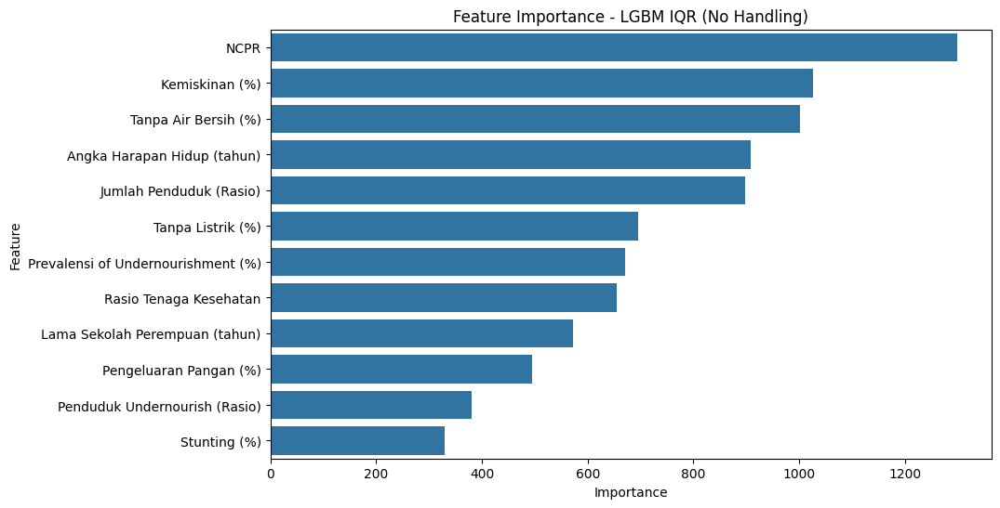

In [ ]:
#Menampilkan Feature Importance LGBM IQR - No Handling

# Train the model on the original IQR data (No Handling)
grid_search_iqr.fit(X_train_iqr, y_train_iqr)
best_model_iqr_no_handling = grid_search_iqr.best_estimator_

# Get feature importances
feature_importances_iqr_no_handling = best_model_iqr_no_handling.feature_importances_

# Create a DataFrame for visualization
feature_importances_df_iqr_no_handling = pd.DataFrame({
    'Feature': X_train_iqr.columns,
    'Importance': feature_importances_iqr_no_handling
}).sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importances_df_iqr_no_handling)
plt.title('Feature Importance - LGBM IQR (No Handling)')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

# Clustering Top 6 Feature Importances

### Import Library

### Function Definition

In [ ]:
# ======================= FUNCTION DEFINITIONS ==============================
# Function to extract top N features
def get_top_n_features(model, X, top_n=6):
    importances = model.feature_importances_
    feature_names = X.columns
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    }).sort_values(by='Importance', ascending=False)

    top_features = importance_df.head(top_n)
    return top_features['Feature'].tolist()

# Function to plot cluster visualizations using UMAP
def plot_clusters(embedding, labels, title):
    unique_labels = sorted(set(labels))
    n_clusters = len(unique_labels) - (1 if -1 in unique_labels else 0)

    palette = sns.color_palette("Set2", n_colors=n_clusters + 1)
    color_dict = {}
    i = 0
    for label in unique_labels:
        if label == -1:
            color_dict[label] = (0.3, 0.3, 0.3)  # grey for noise
        else:
            color_dict[label] = palette[i]
            i += 1

    plt.figure(figsize=(8, 6))
    for label in unique_labels:
        mask = labels == label
        label_name = "Noise" if label == -1 else f"Cluster {label}"
        plt.scatter(embedding[mask, 0], embedding[mask, 1],
                    c=[color_dict[label]], label=label_name,
                    edgecolor='k', s=60, alpha=0.8)

    plt.title(f'Visualisasi Klaster - {title}', fontsize=14)
    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
    plt.legend(title='Klaster', loc='best', frameon=True)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Function to evaluate clustering performance
def evaluate_clusters(X, labels, name):
    filtered = labels[labels != -1]
    if len(set(filtered)) > 1:
        print(f"\nEvaluasi {name}:")
        print("Silhouette Score:", silhouette_score(X, labels))
        print("Davies-Bouldin Score:", davies_bouldin_score(X, labels))
        print("Calinski-Harabasz Score:", calinski_harabasz_score(X, labels))
    else:
        print(f"\nEvaluasi {name}: Tidak cukup klaster untuk evaluasi.")

# ======================= STEP 1: Load and Preprocess Data ===================
df_clus = pd.read_csv('/content/drive/MyDrive/S2 - SEMESTER 2/Statistical Machine Learning/Tugas Kelompok - Ketahanan Pangan/IKP-TAHUN-2018-2023.csv')
df_2023 = df_clus[df_clus['Tahun'] == 2023]

top5_features = get_top_n_features(best_model_iqr_no_handling, X_train_iqr)

df_Clus2023 = df_2023[top5_features]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_Clus2023)

# ======================= STEP 2: Tune DBSCAN ================================
print("Tuning Parameter DBSCAN:")
best_eps = None
best_score = -1

for eps in np.arange(0.2, 2.5, 0.1):
    model = DBSCAN(eps=eps, min_samples=2)
    labels = model.fit_predict(X_scaled)
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    if n_clusters > 1:
        try:
            score = silhouette_score(X_scaled, labels)
            if score > best_score:
                best_score = score
                best_eps = eps
        except:
            continue

print(f"Best DBSCAN eps: {best_eps} | Silhouette Score: {best_score:.3f}")

if best_eps is not None:
    dbscan_model = DBSCAN(eps=best_eps, min_samples=5)
    dbscan_labels = dbscan_model.fit_predict(X_scaled)
else:
    dbscan_labels = np.full(X_scaled.shape[0], -1)

# ======================= STEP 3: Tune HDBSCAN ===============================
print("\nTuning Parameter HDBSCAN:")
best_mcs = None
best_score_hdb = -1

for mcs in range(5, 30, 2):
    model = hdbscan.HDBSCAN(min_cluster_size=mcs)
    labels = model.fit_predict(X_scaled)
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    if n_clusters > 1:
        try:
            score = silhouette_score(X_scaled, labels)
            if score > best_score_hdb:
                best_score_hdb = score
                best_mcs = mcs
        except:
            continue

print(f"Best HDBSCAN min_cluster_size: {best_mcs} | Silhouette Score: {best_score_hdb:.3f}")

if best_mcs is not None:
    hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=best_mcs)
    hdbscan_labels = hdbscan_model.fit_predict(X_scaled)
else:
    hdbscan_labels = np.full(X_scaled.shape[0], -1)

Tuning Parameter DBSCAN:
Best DBSCAN eps: 1.9000000000000006 | Silhouette Score: 0.605

Tuning Parameter HDBSCAN:


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11

Best HDBSCAN min_cluster_size: 5 | Silhouette Score: 0.552


### Hasil Clustering

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


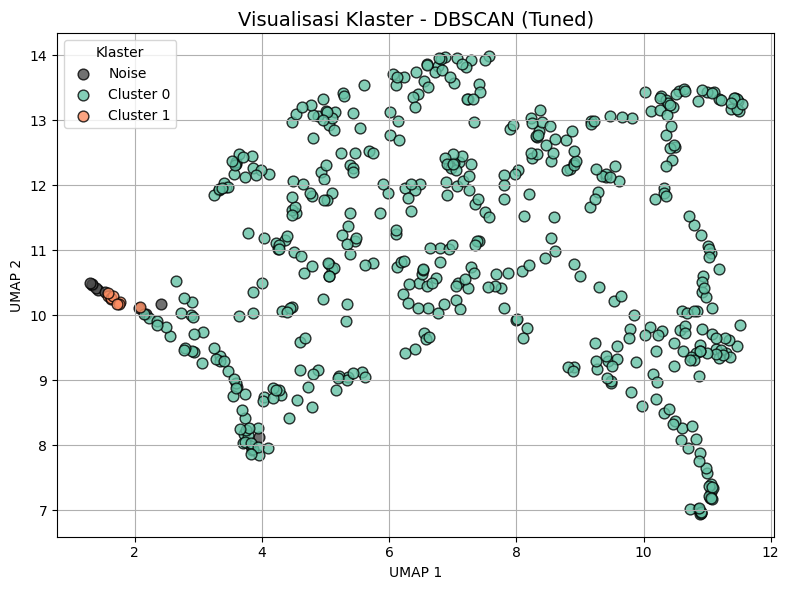

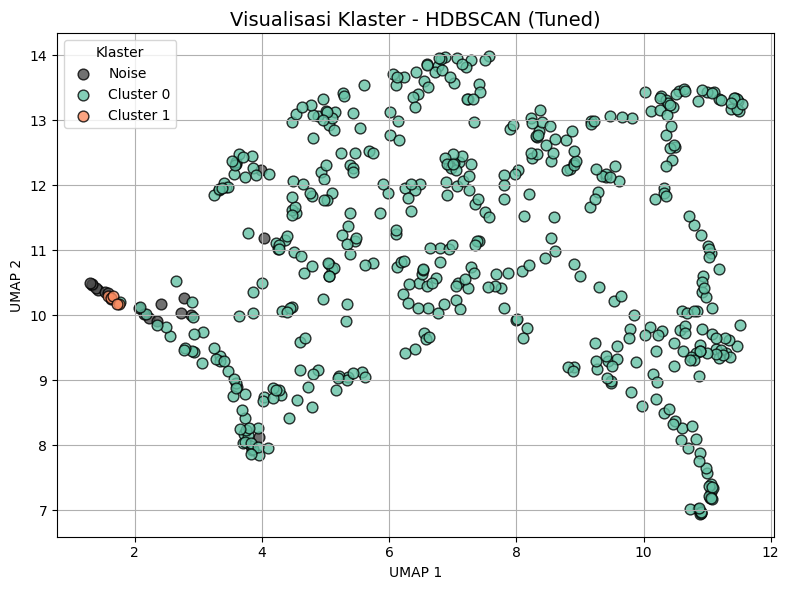


Evaluasi DBSCAN:
Silhouette Score: 0.5639498675773085
Davies-Bouldin Score: 2.129008446560332
Calinski-Harabasz Score: 74.20024404587903

Evaluasi HDBSCAN:
Silhouette Score: 0.5517538176617084
Davies-Bouldin Score: 1.8127166854508665
Calinski-Harabasz Score: 70.89052725630577


In [ ]:
# ======================= STEP 4: Visualize with UMAP ========================
reducer = umap.UMAP(random_state=42)
X_umap = reducer.fit_transform(X_scaled)

plot_clusters(X_umap, dbscan_labels, "DBSCAN (Tuned)")
plot_clusters(X_umap, hdbscan_labels, "HDBSCAN (Tuned)")

# ======================= STEP 5: Cluster Evaluation =========================
evaluate_clusters(X_scaled, dbscan_labels, "DBSCAN")
evaluate_clusters(X_scaled, hdbscan_labels, "HDBSCAN")

# ======================= STEP 6: Save & Show Results ========================
# Menyimpan hasil clustering ke dalam DataFrame
df_result = df_Clus2023.copy()
df_result['Wilayah'] = df_2023['Wilayah'].values
df_result['DBSCAN_Cluster'] = dbscan_labels
df_result['HDBSCAN_Cluster'] = hdbscan_labels


Jumlah anggota per klaster DBSCAN:
 DBSCAN_Cluster
 0    493
-1     12
 1      9
Name: count, dtype: int64

Jumlah anggota per klaster HDBSCAN:
 HDBSCAN_Cluster
 0    488
-1     21
 1      5
Name: count, dtype: int64

Statistik per Klaster (DBSCAN):


,NCPR,Kemiskinan (%),Tanpa Air Bersih (%),Angka Harapan Hidup (tahun),Jumlah Penduduk (Rasio),Tanpa Listrik (%),HDBSCAN_Cluster
DBSCAN_Cluster,,,,,,,
-1,3.677500,26.737500,64.808333,63.816667,1.013888e+06,33.160000,-0.916667
0,1.164523,10.880061,28.820203,70.158844,5.381805e+05,1.132718,-0.016227
1,5.000000,35.553333,86.826667,65.491111,1.340591e+05,27.088889,0.333333



Statistik per Klaster (HDBSCAN):


,NCPR,Kemiskinan (%),Tanpa Air Bersih (%),Angka Harapan Hidup (tahun),Jumlah Penduduk (Rasio),Tanpa Listrik (%),DBSCAN_Cluster
HDBSCAN_Cluster,,,,,,,
-1,3.765714,25.950000,65.368095,64.299048,656778.904762,25.968571,-0.428571
0,1.145820,10.810799,28.525820,70.209549,541455.573770,1.063914,0.002049
1,5.000000,36.816000,94.834000,66.198000,134703.200000,27.124000,1.000000


<ipython-input-36-aab50c63e5b0>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='DBSCAN_Cluster', data=df_result, palette='Set2')


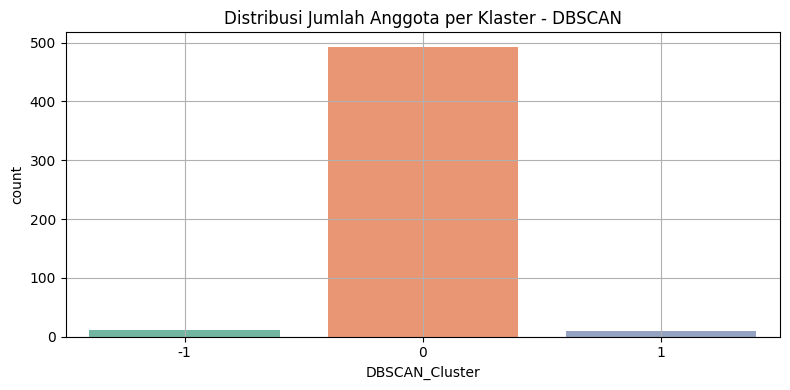

<ipython-input-36-aab50c63e5b0>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='HDBSCAN_Cluster', data=df_result, palette='Set2')


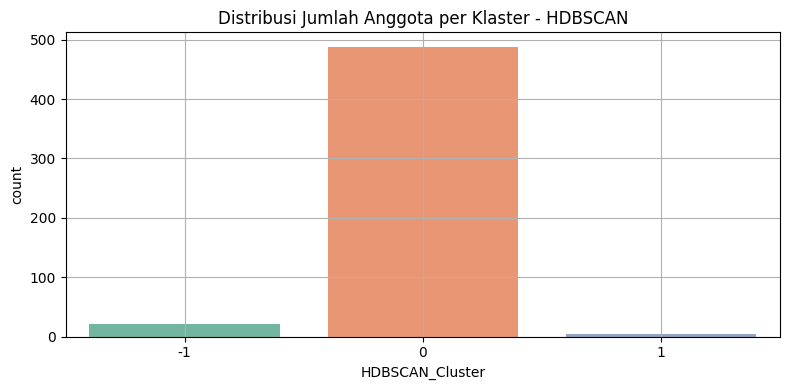

In [ ]:
# Menampilkan jumlah anggota per klaster
print("\nJumlah anggota per klaster DBSCAN:\n", df_result['DBSCAN_Cluster'].value_counts())
print("\nJumlah anggota per klaster HDBSCAN:\n", df_result['HDBSCAN_Cluster'].value_counts())

# Menampilkan statistik rata-rata tiap klaster
print("\nStatistik per Klaster (DBSCAN):")
display(df_result.groupby('DBSCAN_Cluster').mean(numeric_only=True))
print("\nStatistik per Klaster (HDBSCAN):")
display(df_result.groupby('HDBSCAN_Cluster').mean(numeric_only=True))

# Visualisasi distribusi anggota klaster DBSCAN
plt.figure(figsize=(8, 4))
sns.countplot(x='DBSCAN_Cluster', data=df_result, palette='Set2')
plt.title("Distribusi Jumlah Anggota per Klaster - DBSCAN")
plt.grid(True)
plt.tight_layout()
plt.show()

# Visualisasi distribusi anggota klaster HDBSCAN
plt.figure(figsize=(8, 4))
sns.countplot(x='HDBSCAN_Cluster', data=df_result, palette='Set2')
plt.title("Distribusi Jumlah Anggota per Klaster - HDBSCAN")
plt.grid(True)
plt.tight_layout()
plt.show()

# Insight Hasil Clustering

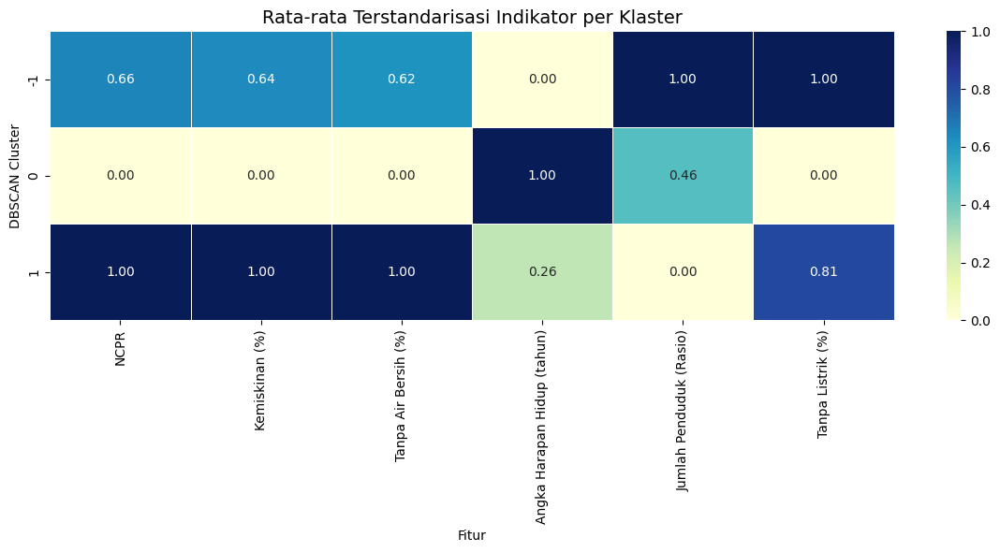

<ipython-input-37-a166efb51f51>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='DBSCAN_Cluster', y=fitur, data=df_result, estimator=np.mean, palette='Set2')


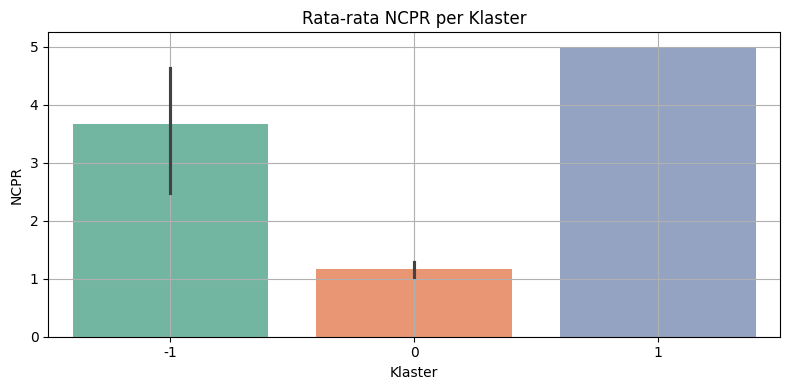

<ipython-input-37-a166efb51f51>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='DBSCAN_Cluster', y=fitur, data=df_result, estimator=np.mean, palette='Set2')


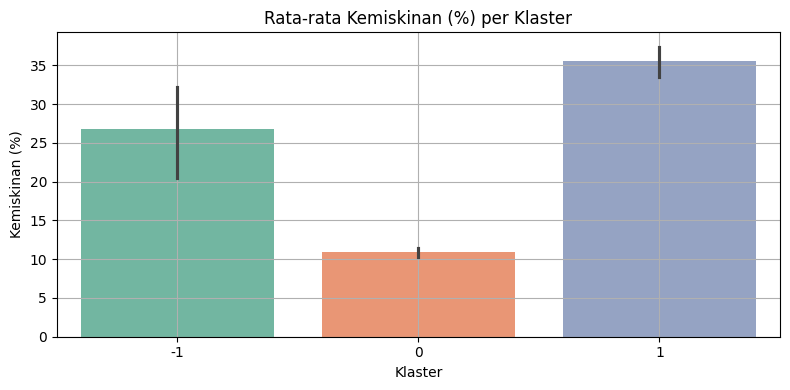

<ipython-input-37-a166efb51f51>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='DBSCAN_Cluster', y=fitur, data=df_result, estimator=np.mean, palette='Set2')


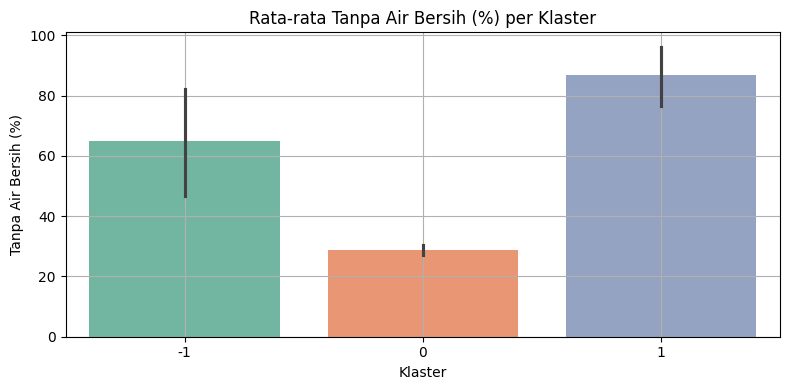

<ipython-input-37-a166efb51f51>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='DBSCAN_Cluster', y=fitur, data=df_result, estimator=np.mean, palette='Set2')


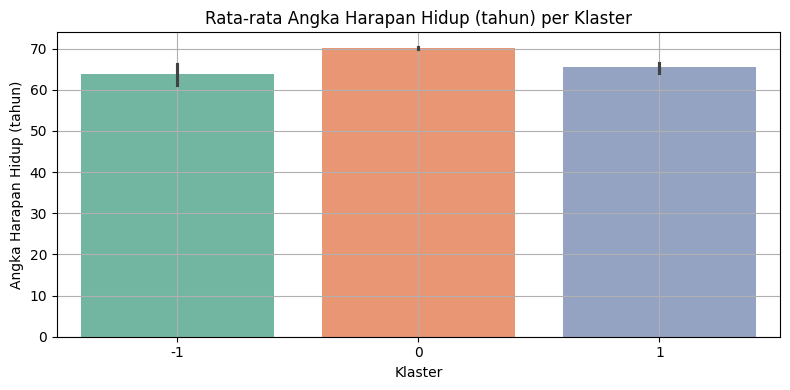

<ipython-input-37-a166efb51f51>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='DBSCAN_Cluster', y=fitur, data=df_result, estimator=np.mean, palette='Set2')


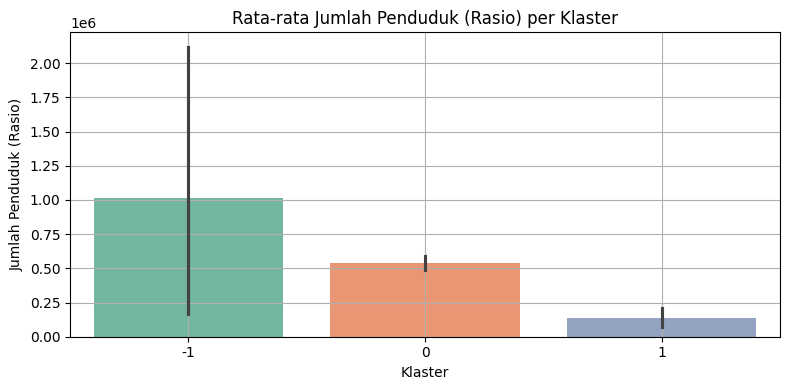

<ipython-input-37-a166efb51f51>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='DBSCAN_Cluster', y=fitur, data=df_result, estimator=np.mean, palette='Set2')


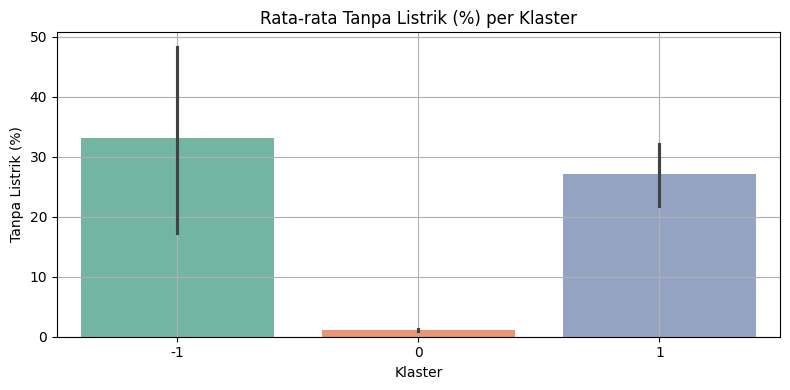

In [ ]:
# 1. Ringkasan rata-rata tiap fitur per klaster DBSCAN
summary = df_result.groupby('DBSCAN_Cluster')[df_Clus2023.columns].mean()

# 2. Normalisasi untuk heatmap (0–1)
summary_normalized = (summary - summary.min()) / (summary.max() - summary.min())

# 3. Heatmap visualisasi hasil normalisasi
plt.figure(figsize=(12, 6))
sns.heatmap(summary_normalized, cmap="YlGnBu", annot=True, fmt=".2f", linewidths=0.5)
plt.title("Rata-rata Terstandarisasi Indikator per Klaster", fontsize=14)
plt.ylabel("DBSCAN Cluster")
plt.xlabel("Fitur")
plt.tight_layout()
plt.show()

# 4. Buat diagram batang untuk semua fitur indikator numerik dalam df_Clus2023
fitur_numerik = df_Clus2023.columns.tolist()  # Ambil semua kolom numerik

for fitur in fitur_numerik:
    plt.figure(figsize=(8, 4))
    sns.barplot(x='DBSCAN_Cluster', y=fitur, data=df_result, estimator=np.mean, palette='Set2')
    plt.title(f'Rata-rata {fitur} per Klaster')
    plt.ylabel(fitur)
    plt.xlabel("Klaster")
    plt.grid(True)
    plt.tight_layout()
    plt.show()
